<a href="https://colab.research.google.com/github/namwootree/UNIST_AICP/blob/main/REPROT/Tree_Based_Machine_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setting

## Git Clone

팀장 GitHub의 UNIST_AICP Repositry Clone하기 (복붙 or 다운로드)

In [1]:
!git clone https://github.com/namwootree/UNIST_AICP.git

Cloning into 'UNIST_AICP'...
remote: Enumerating objects: 75, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 75 (delta 12), reused 0 (delta 0), pack-reused 53
Unpacking objects: 100% (75/75), 6.72 MiB | 2.22 MiB/s, done.


## Load AICP.py

UNIST_AICP Repositry 내 파일 중 Tree_Based_Machine_Learning.py 저장 위치 옮기기

In [2]:
!mv ./UNIST_AICP/Tree_Based_Machine_Learning.py .

Tree_Based_Machine_Learning.py 실행 (필수 X)

In [3]:
!python3 ./Tree_Based_Machine_Learning.py

2023년 UNIST AICP TEAM : UNIST 동학 개미

Tree_Based_Machine_Learning.py : 트리 기반 머신러닝 모델 비교를 위한 모듈

코드 작성자 : 권남우(팀장)
Source Code : https://github.com/namwootree/UNIST_AICP
Thank You


## Load Library

In [4]:
# 모듈
import Tree_Based_Machine_Learning as TML

In [5]:
# 데이터 
import pandas as pd
import numpy as np
from scipy import stats 

In [6]:
# 시각화
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
# 머신러닝
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

In [8]:
# 성능
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score # 정확도
from sklearn.metrics import precision_score # 정밀도
from sklearn.metrics import recall_score # 재현율
from sklearn.metrics import f1_score # F1-Score
from sklearn.metrics import confusion_matrix

In [9]:
# 기타
import random
import os

## Fix Random Seed

In [10]:
TML.my_seed_everywhere(seed=42)

고정된 Seed : 42


# Load DataSet

## Google Drive Mount

In [11]:
# 구글 코랩 사용 시 실행
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Load CSV

In [12]:
# 자신의 경로에 맞게 수정
path_file = '/content/drive/MyDrive/UNIST/AICP/data/dynmom_dat.csv'

dynmom = pd.read_csv(path_file)

# Preproseeing

In [13]:
dynmom = TML.preprocessing(dynmom)

'DATE'를 칼럼 대신 인덱스로 사용
결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')


# Modeling

## Generate Target

In [14]:
dynmom, WML = TML.normal_wml(dynmom)

'wml'이 양수면 1 & 음수면 0
Output : 'Preprocessed_Data' & 'WML'

Ratio : 0.5634379263301501
1.0    733
0.0    413
Name: pos_wml, dtype: int64


## Define Model

**모델 하이퍼파라미터 참조 사이트 (오피셜)**
  - [Random Forest Classifier](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html)
  - [Gradient Boosting Classifier](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html)
  - [XGBoost Classifier](https://xgboost.readthedocs.io/en/stable/parameter.html)

In [15]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

In [16]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

In [17]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

## Fixed

### Random Forest

**************************************************

RDF Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/905 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.24      0.30       315
         1.0       0.67      0.81      0.73       590

    accuracy                           0.61       905
   macro avg       0.54      0.53      0.52       905
weighted avg       0.58      0.61      0.58       905


accuracy : 0.6132596685082873

precision : 0.6671309192200557

recall : 0.811864406779661

F1-Score : 0.7324159021406728



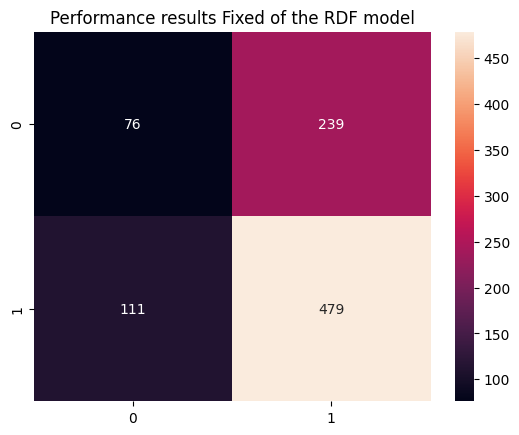


Feature Importance of the model



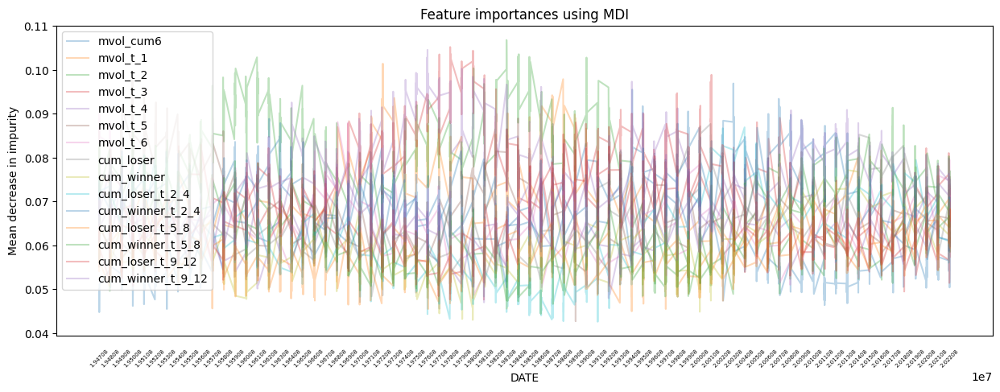

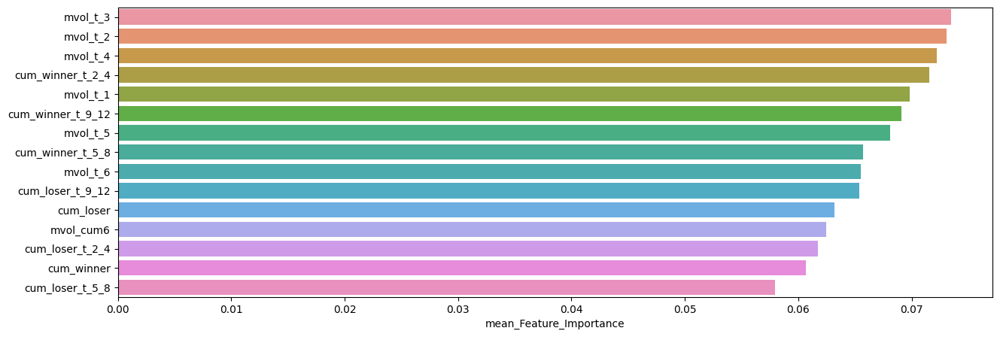

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.073465,0.105243,0.050744
mvol_t_2,0.073106,0.106831,0.048288
mvol_t_4,0.072238,0.104591,0.050169
cum_winner_t_2_4,0.071544,0.096941,0.050474
mvol_t_1,0.069827,0.101452,0.052625
cum_winner_t_9_12,0.069081,0.092603,0.047019
mvol_t_5,0.068078,0.097758,0.042722
cum_winner_t_5_8,0.065707,0.091414,0.044402
mvol_t_6,0.065507,0.090149,0.048724
cum_loser_t_9_12,0.065408,0.098914,0.047663


In [18]:
Fixed_RDF_Result = TML.Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                      model=RDF, # 사용할 모델
                                      model_name='RDF', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470829 ~ 19660531

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.24      0.30        75
         1.0       0.69      0.83      0.75       151

    accuracy                           0.63       226
   macro avg       0.55      0.53      0.53       226
weighted avg       0.59      0.63      0.60       226


accuracy : 0.6327433628318584

precision : 0.6868131868131868

recall : 0.8278145695364238

F1-Score : 0.7507507507507508



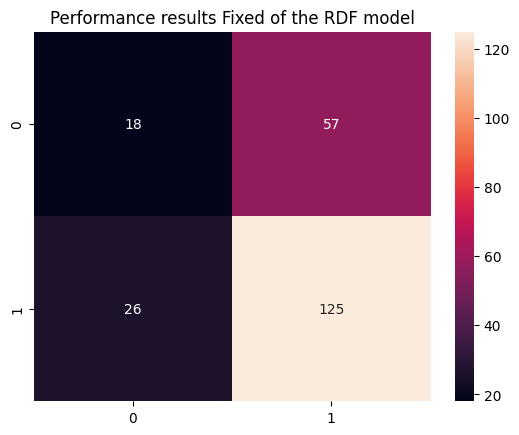


Feature Importance of the model



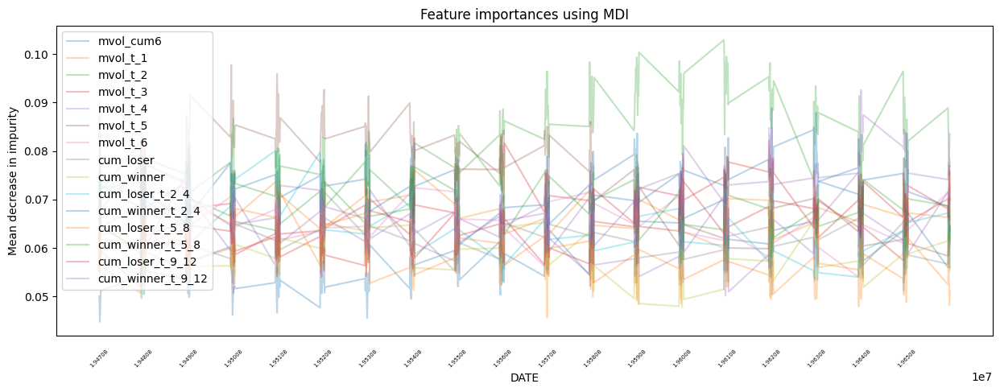

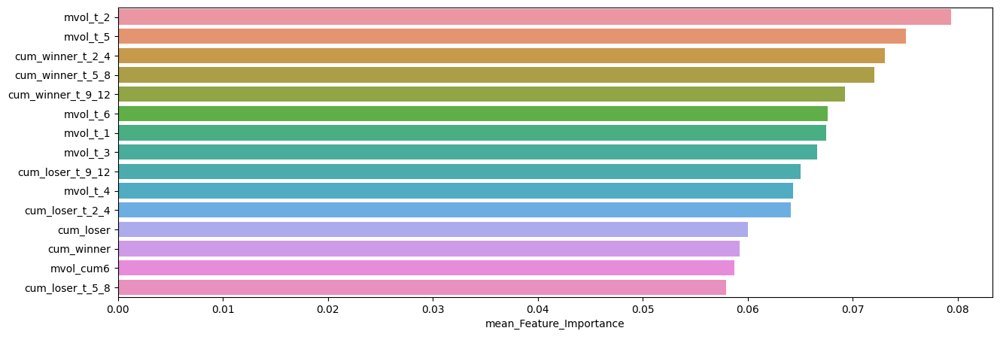

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.079354,0.102888,0.049638
mvol_t_5,0.075101,0.097758,0.054458
cum_winner_t_2_4,0.073087,0.088853,0.060745
cum_winner_t_5_8,0.072062,0.088252,0.056766
cum_winner_t_9_12,0.069276,0.092603,0.054863
mvol_t_6,0.067629,0.090149,0.054054
mvol_t_1,0.067492,0.078586,0.054114
mvol_t_3,0.066633,0.082962,0.050744
cum_loser_t_9_12,0.065072,0.082207,0.052155
mvol_t_4,0.064287,0.076724,0.050169



**************************************************

DATE : 19660630 ~ 19850329

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.20      0.27        74
         1.0       0.69      0.86      0.77       152

    accuracy                           0.65       226
   macro avg       0.55      0.53      0.52       226
weighted avg       0.60      0.65      0.60       226


accuracy : 0.6460176991150443

precision : 0.6894736842105263

recall : 0.8618421052631579

F1-Score : 0.7660818713450291



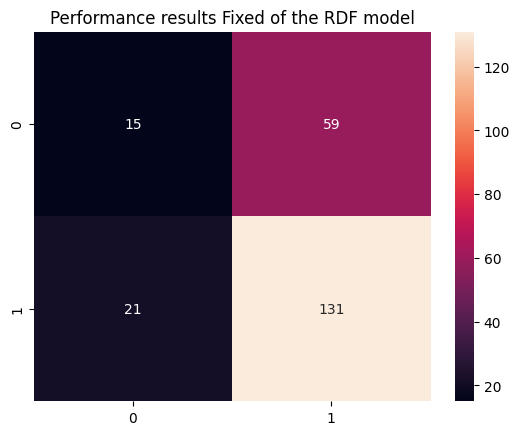


Feature Importance of the model



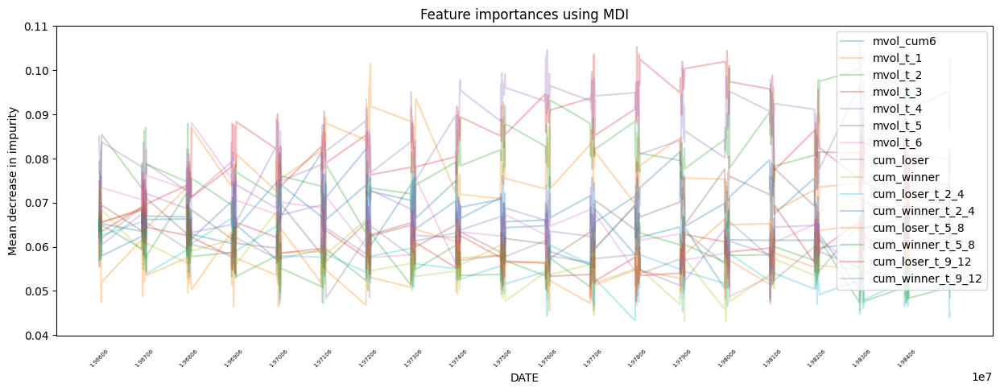

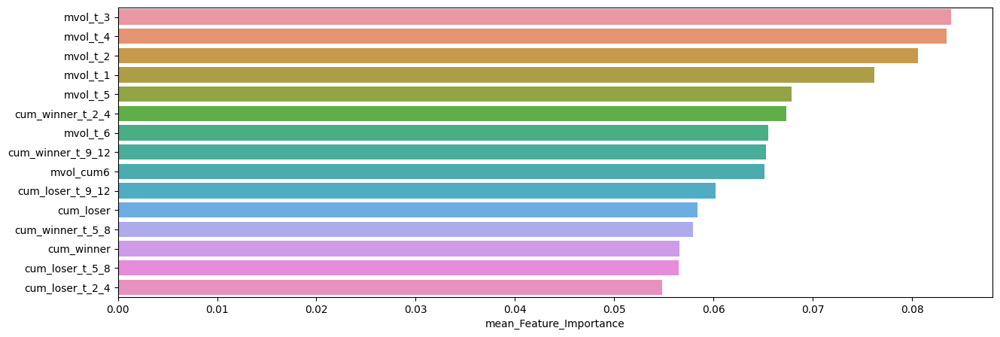

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.083916,0.105243,0.060569
mvol_t_4,0.083446,0.104591,0.060484
mvol_t_2,0.080628,0.106831,0.058587
mvol_t_1,0.076237,0.101452,0.059480
mvol_t_5,0.067880,0.088966,0.055248
cum_winner_t_2_4,0.067313,0.081491,0.050474
mvol_t_6,0.065535,0.088169,0.048724
cum_winner_t_9_12,0.065319,0.084925,0.047019
mvol_cum6,0.065165,0.082133,0.050535
cum_loser_t_9_12,0.060236,0.074813,0.047663



**************************************************

DATE : 19850430 ~ 20040130

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.24      0.30        70
         1.0       0.71      0.83      0.76       156

    accuracy                           0.65       226
   macro avg       0.55      0.53      0.53       226
weighted avg       0.61      0.65      0.62       226


accuracy : 0.6460176991150443

precision : 0.7087912087912088

recall : 0.8269230769230769

F1-Score : 0.7633136094674556



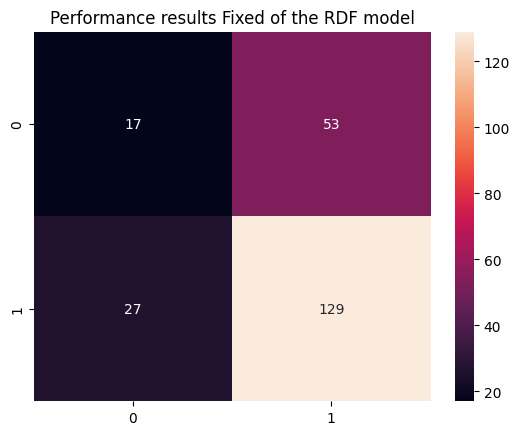


Feature Importance of the model



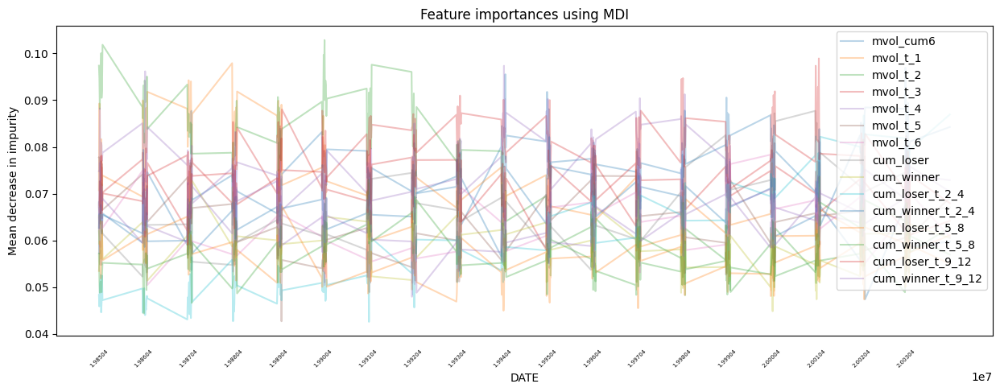

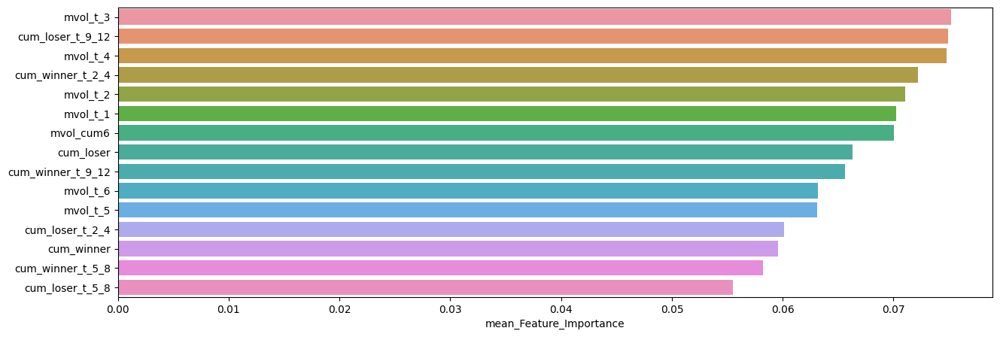

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.075177,0.090976,0.058646
cum_loser_t_9_12,0.074944,0.098914,0.058045
mvol_t_4,0.074786,0.097350,0.054636
cum_winner_t_2_4,0.072197,0.096941,0.056590
mvol_t_2,0.071032,0.102836,0.048288
mvol_t_1,0.070263,0.097911,0.052625
mvol_cum6,0.070002,0.095532,0.047414
cum_loser,0.066284,0.087708,0.052287
cum_winner_t_9_12,0.065628,0.080930,0.047967
mvol_t_6,0.063176,0.078334,0.050472



**************************************************

DATE : 20040227 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.27      0.33        96
         1.0       0.57      0.72      0.64       131

    accuracy                           0.53       227
   macro avg       0.49      0.49      0.48       227
weighted avg       0.51      0.53      0.51       227


accuracy : 0.5286343612334802

precision : 0.573170731707317

recall : 0.7175572519083969

F1-Score : 0.6372881355932203



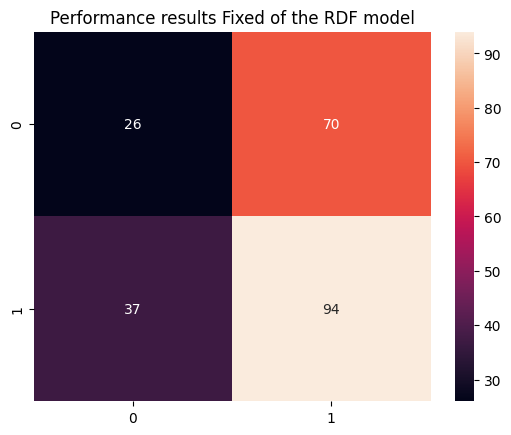


Feature Importance of the model



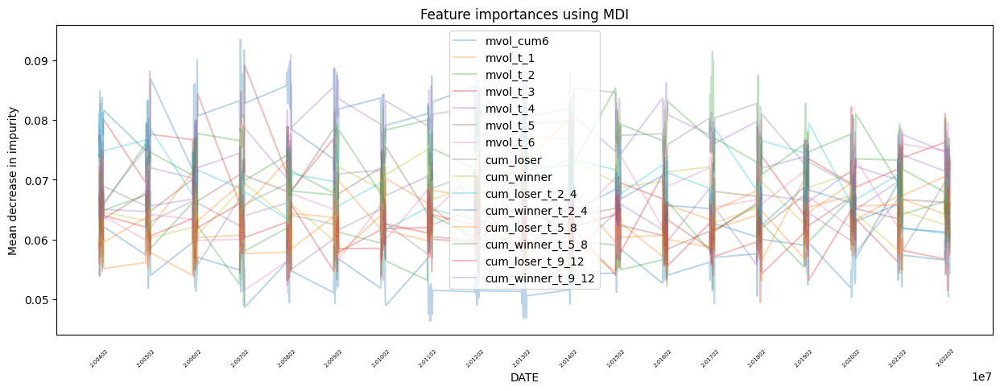

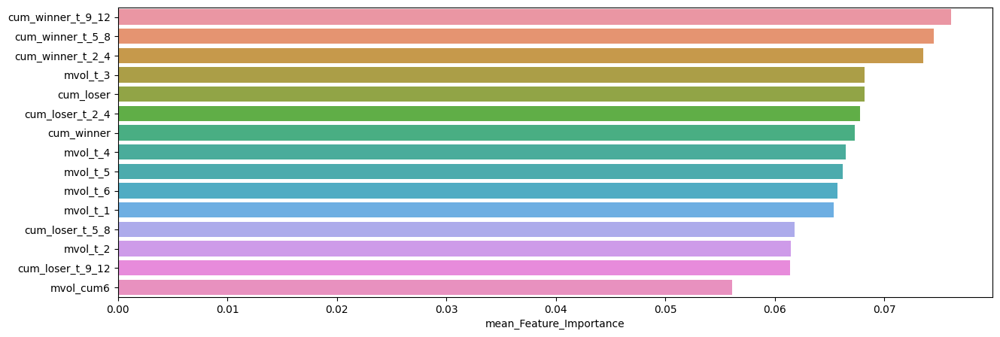

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,0.076071,0.090919,0.060839
cum_winner_t_5_8,0.074523,0.091414,0.061087
cum_winner_t_2_4,0.073570,0.093441,0.056690
mvol_t_3,0.068158,0.089104,0.053083
cum_loser,0.068153,0.085272,0.055775
cum_loser_t_2_4,0.067791,0.083383,0.056048
cum_winner,0.067325,0.081965,0.054273
mvol_t_4,0.066458,0.079981,0.055053
mvol_t_5,0.066222,0.081323,0.055327
mvol_t_6,0.065688,0.079529,0.051035


In [19]:
TML.slice_feature_importance(Fixed_RDF_Result, # 모델 추론 결과 데이터
                             4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                             'Fixed', # Rolling Windows Method
                             'RDF') # 모델 명

Sharpe Ratio : 0.67434

최근 누적 수익률

  2022년-12월 -> 8584.02
  2022년-11월 -> 8584.02
  2022년-10월 -> 8584.02
  2022년-09월 -> 8584.02
  2022년-08월 -> 8584.02

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2008년-11월 -> 41937.73
  2등 : 2008년-10월 -> 41937.73
  3등 : 2009년-03월 -> 40945.08
  4등 : 2009년-02월 -> 40945.08
  5등 : 2009년-01월 -> 40945.08
  6등 : 2008년-12월 -> 40945.08
  7등 : 2008년-09월 -> 39591.87
  8등 : 2008년-06월 -> 35857.30
  9등 : 2008년-07월 -> 35857.30
  10등 : 2008년-08월 -> 35291.46



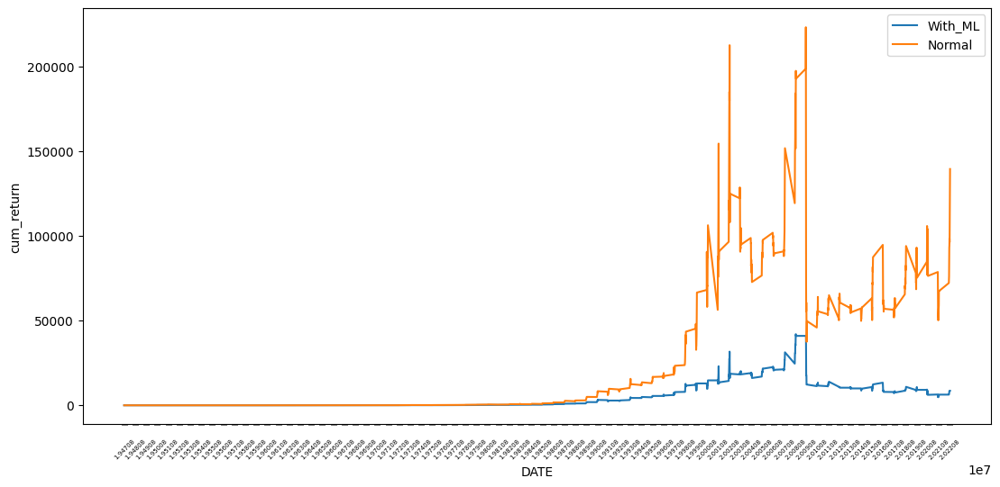

In [20]:
RDF_F_CUM_RETURN_static = TML.cumm_return_by_dynamic(Fixed_RDF_Result, WML, 'RDF_PRED_POS_WML', plot=True)

Sharpe Ratio : 0.77256

최근 누적 수익률

  2022년-12월 -> 4262.73
  2022년-11월 -> 4049.08
  2022년-10월 -> 3979.66
  2022년-09월 -> 3774.59
  2022년-08월 -> 3615.57

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 6886.52
  2등 : 2009년-01월 -> 6563.42
  3등 : 2008년-11월 -> 6560.46
  4등 : 2008년-12월 -> 6467.28
  5등 : 2002년-09월 -> 6260.98
  6등 : 2008년-10월 -> 6258.17
  7등 : 2008년-09월 -> 6064.12
  8등 : 2008년-06월 -> 6037.53
  9등 : 2008년-07월 -> 5701.29
  10등 : 2002년-07월 -> 5676.12



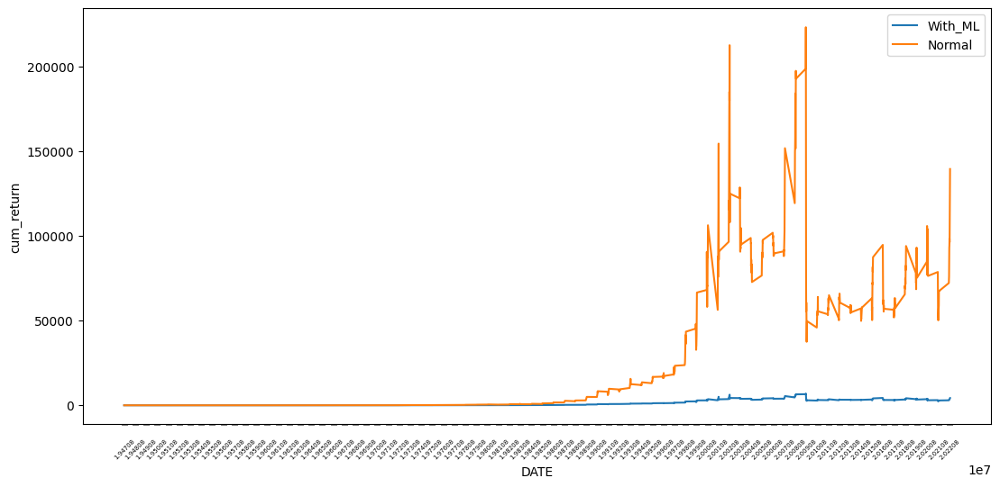

In [21]:
RDF_F_CUM_RETURN_dynamic = TML.cumm_return_by_dynamic(Fixed_RDF_Result, # 모델 추론 결과 데이터
                                                      WML, # 원본 데이터의 'wml' 데이터
                                                      'RDF_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                      plot=True) # 시각화 여부

### Gradient Boosting

**************************************************

GBC Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/905 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.32      0.36       315
         1.0       0.68      0.76      0.72       590

    accuracy                           0.61       905
   macro avg       0.55      0.54      0.54       905
weighted avg       0.59      0.61      0.59       905


accuracy : 0.6088397790055249

precision : 0.6771771771771772

recall : 0.764406779661017

F1-Score : 0.7181528662420383



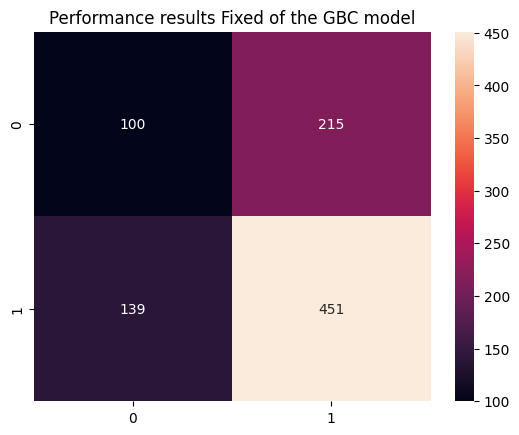


Feature Importance of the model



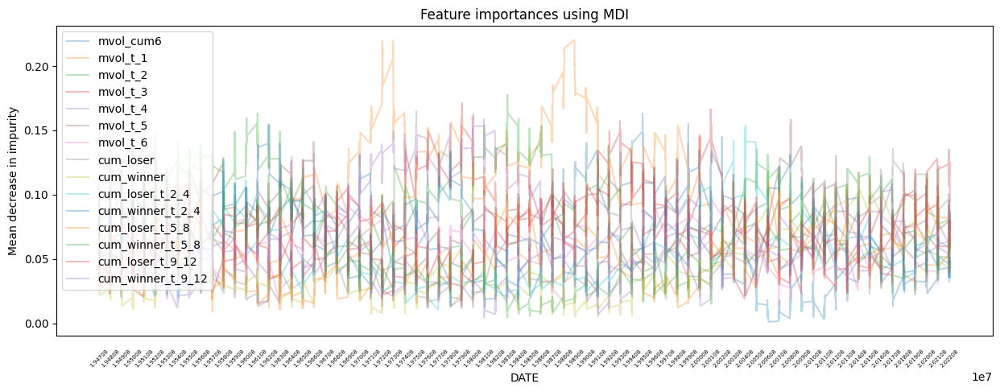

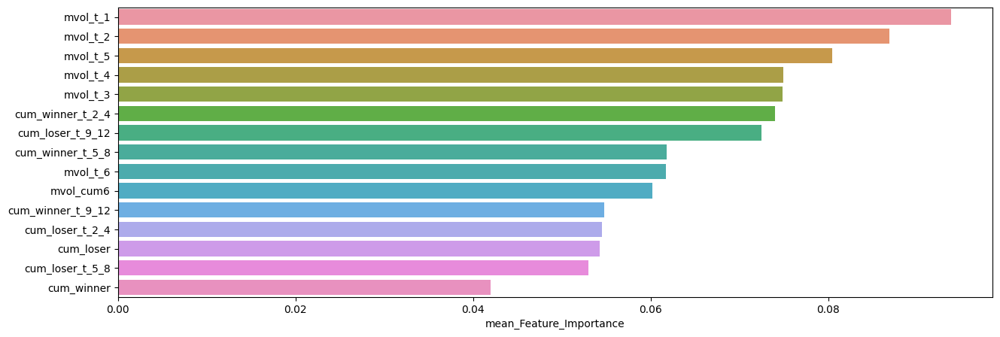

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.093835,0.220118,0.009135
mvol_t_2,0.086869,0.177779,0.015199
mvol_t_5,0.080429,0.158419,0.013340
mvol_t_4,0.074958,0.164923,0.016122
mvol_t_3,0.074832,0.171179,0.019198
cum_winner_t_2_4,0.074032,0.155154,0.024254
cum_loser_t_9_12,0.072528,0.166409,0.017762
cum_winner_t_5_8,0.061856,0.135360,0.004652
mvol_t_6,0.061752,0.157886,0.013340
mvol_cum6,0.060251,0.163172,0.001322


In [22]:
Fixed_GBC_Result = TML.Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                      model=GBC, # 사용할 모델
                                      model_name='GBC', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470829 ~ 19660531

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.32      0.27      0.29        75
         1.0       0.66      0.72      0.69       151

    accuracy                           0.57       226
   macro avg       0.49      0.49      0.49       226
weighted avg       0.55      0.57      0.56       226


accuracy : 0.5707964601769911

precision : 0.6646341463414634

recall : 0.7218543046357616

F1-Score : 0.6920634920634922



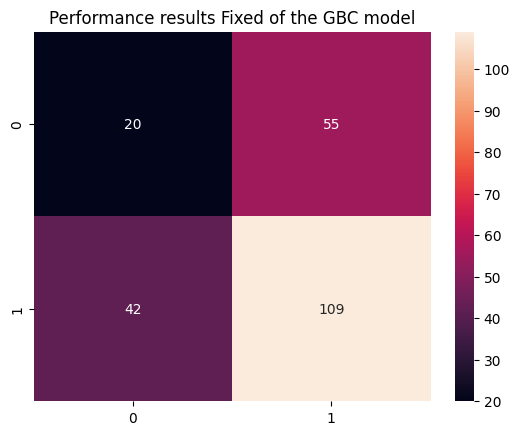


Feature Importance of the model



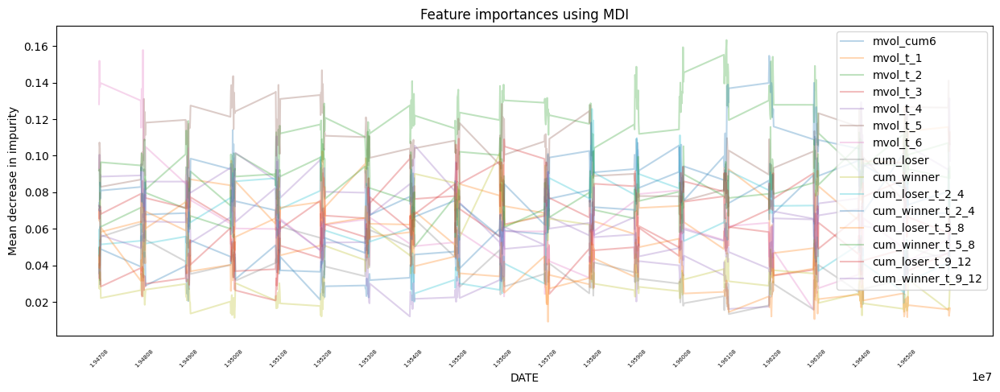

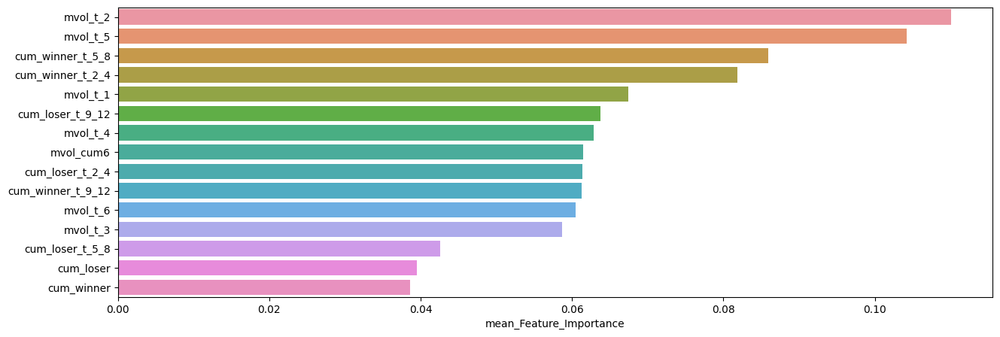

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.110054,0.163309,0.031805
mvol_t_5,0.104197,0.146791,0.063035
cum_winner_t_5_8,0.085880,0.128575,0.050270
cum_winner_t_2_4,0.081839,0.154702,0.033172
mvol_t_1,0.067476,0.126817,0.009135
cum_loser_t_9_12,0.063745,0.109307,0.020767
mvol_t_4,0.062896,0.110637,0.016122
mvol_cum6,0.061450,0.110454,0.020437
cum_loser_t_2_4,0.061344,0.125614,0.019423
cum_winner_t_9_12,0.061241,0.131427,0.012042



**************************************************

DATE : 19660630 ~ 19850329

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.35      0.39        74
         1.0       0.71      0.78      0.75       152

    accuracy                           0.64       226
   macro avg       0.58      0.57      0.57       226
weighted avg       0.62      0.64      0.63       226


accuracy : 0.6415929203539823

precision : 0.7125748502994012

recall : 0.7828947368421053

F1-Score : 0.7460815047021944



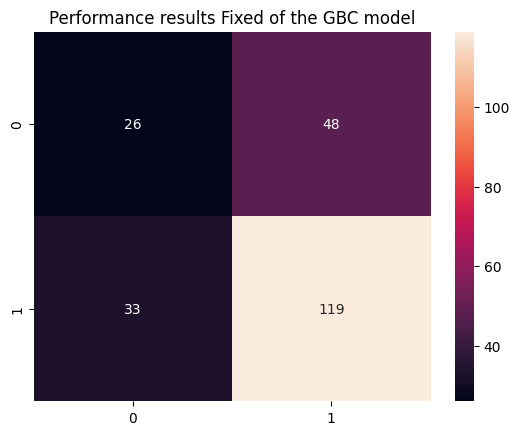


Feature Importance of the model



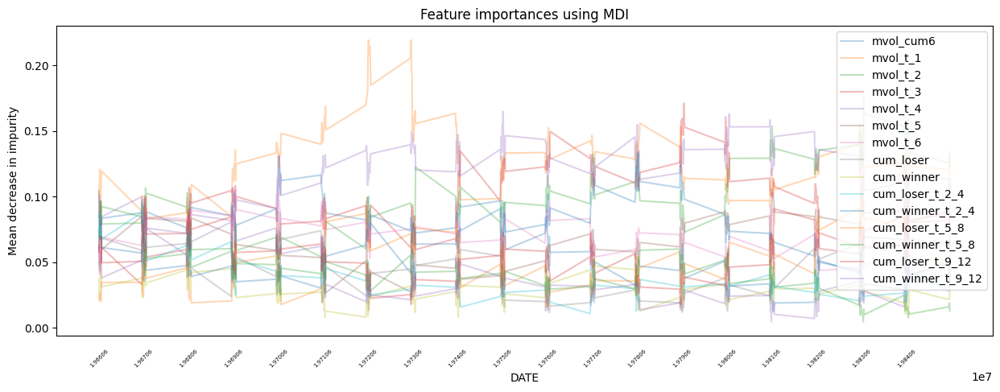

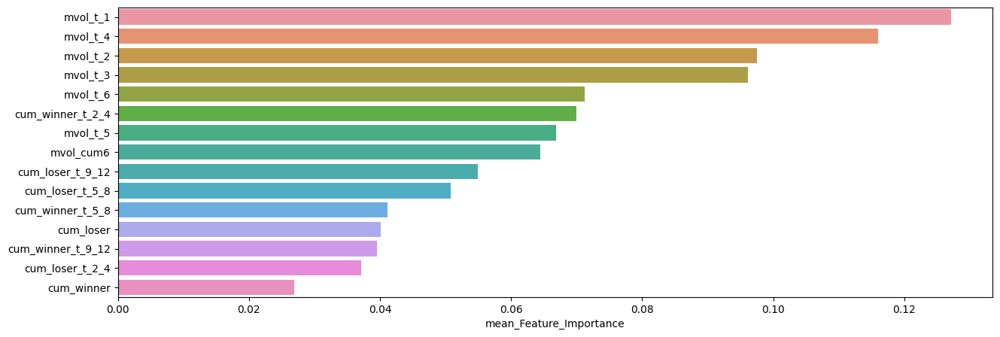

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.127102,0.219448,0.063345
mvol_t_4,0.116011,0.164923,0.036688
mvol_t_2,0.097497,0.177779,0.037783
mvol_t_3,0.096083,0.171179,0.033112
mvol_t_6,0.071249,0.113652,0.039314
cum_winner_t_2_4,0.070008,0.133878,0.030186
mvol_t_5,0.066907,0.106938,0.013340
mvol_cum6,0.064501,0.130453,0.012792
cum_loser_t_9_12,0.054933,0.100535,0.017762
cum_loser_t_5_8,0.050771,0.113288,0.015449



**************************************************

DATE : 19850430 ~ 20040130

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.43      0.29      0.34        70
         1.0       0.72      0.83      0.77       156

    accuracy                           0.66       226
   macro avg       0.57      0.56      0.56       226
weighted avg       0.63      0.66      0.64       226


accuracy : 0.6592920353982301

precision : 0.7206703910614525

recall : 0.8269230769230769

F1-Score : 0.7701492537313432



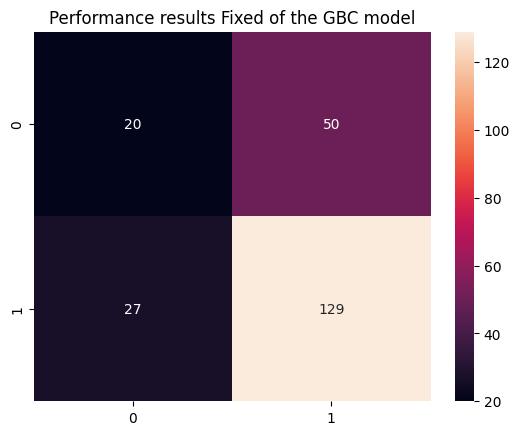


Feature Importance of the model



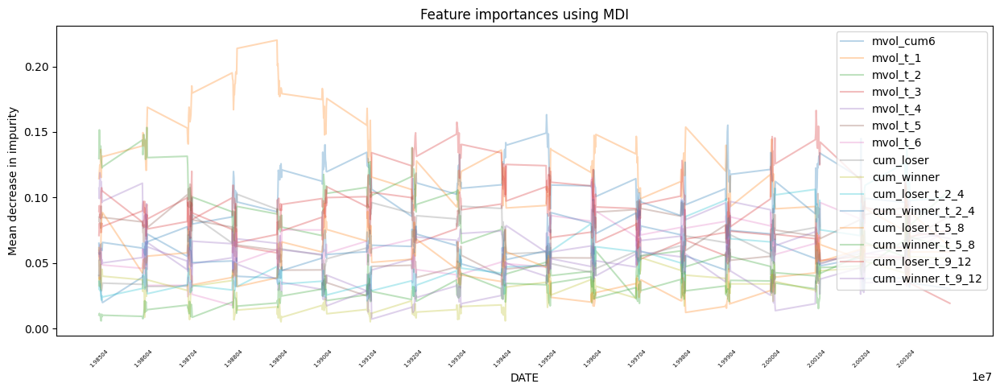

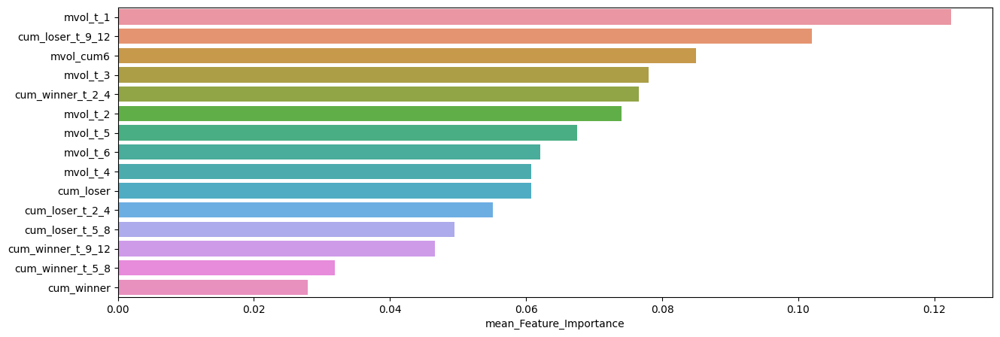

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.122433,0.220118,0.035740
cum_loser_t_9_12,0.101965,0.166409,0.061136
mvol_cum6,0.084941,0.163172,0.019728
mvol_t_3,0.078049,0.125667,0.019198
cum_winner_t_2_4,0.076596,0.155154,0.032056
mvol_t_2,0.073979,0.153429,0.015199
mvol_t_5,0.067448,0.110466,0.024857
mvol_t_6,0.062032,0.115227,0.017705
mvol_t_4,0.060808,0.118792,0.021272
cum_loser,0.060727,0.102462,0.028710



**************************************************

DATE : 20040227 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.48      0.35      0.41        96
         1.0       0.60      0.72      0.66       131

    accuracy                           0.56       227
   macro avg       0.54      0.54      0.53       227
weighted avg       0.55      0.56      0.55       227


accuracy : 0.5638766519823789

precision : 0.6025641025641025

recall : 0.7175572519083969

F1-Score : 0.6550522648083623



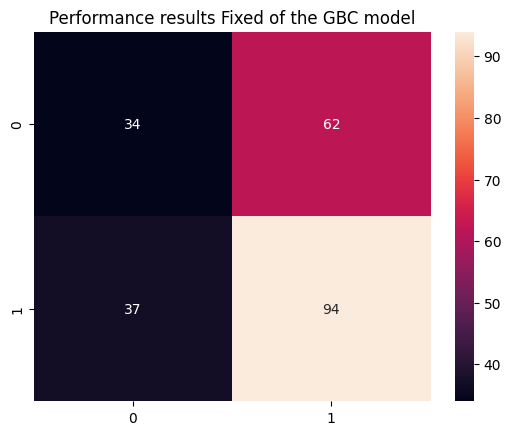


Feature Importance of the model



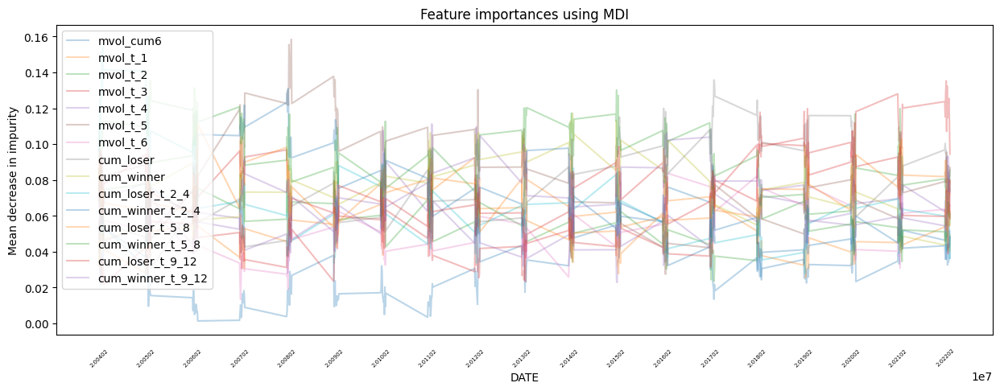

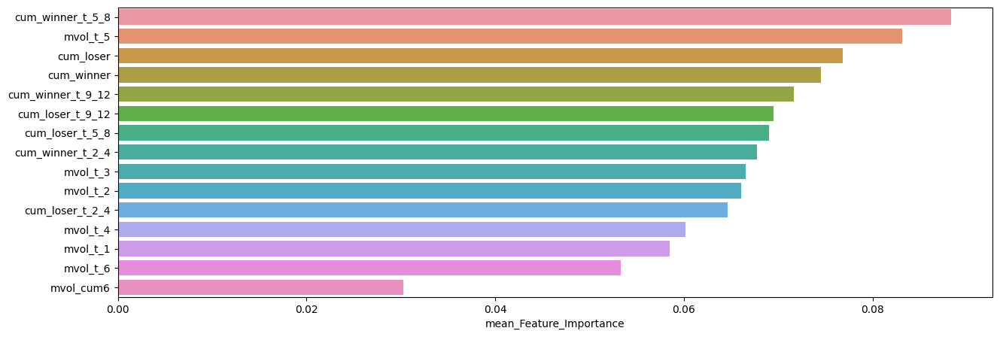

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.088290,0.135360,0.034521
mvol_t_5,0.083152,0.158419,0.027400
cum_loser,0.076813,0.135757,0.030580
cum_winner,0.074545,0.117165,0.032056
cum_winner_t_9_12,0.071648,0.111186,0.038961
cum_loser_t_9_12,0.069481,0.119766,0.023243
cum_loser_t_5_8,0.068977,0.111084,0.027726
cum_winner_t_2_4,0.067713,0.131005,0.024254
mvol_t_3,0.066531,0.135170,0.021570
mvol_t_2,0.066040,0.119807,0.023462


In [23]:
TML.slice_feature_importance(Fixed_GBC_Result, 4, 'Fixed', 'GBC')

Sharpe Ratio : 0.72231

최근 누적 수익률

  2022년-12월 -> 10084.79
  2022년-11월 -> 10084.79
  2022년-10월 -> 10084.79
  2022년-09월 -> 8929.84
  2022년-08월 -> 8929.84

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 26447.37
  2등 : 2002년-07월 -> 23029.93
  3등 : 2002년-08월 -> 22362.71
  4등 : 2002년-06월 -> 21835.41
  5등 : 2008년-11월 -> 21797.01
  6등 : 2002년-10월 -> 21338.96
  7등 : 2008년-12월 -> 21281.07
  8등 : 2009년-01월 -> 21281.07
  9등 : 2009년-02월 -> 21281.07
  10등 : 2009년-03월 -> 21281.07



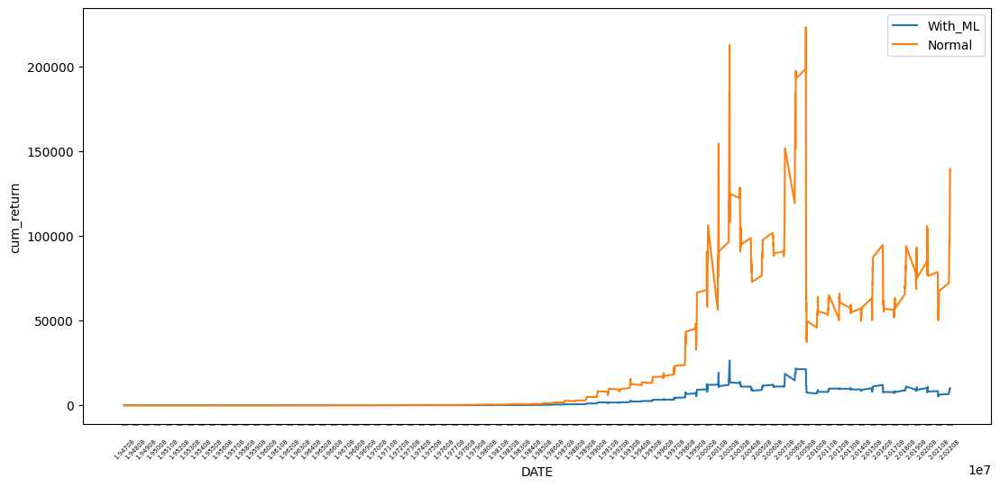

In [24]:
GBC_F_CUM_RETURN_static = TML.cumm_return_by_dynamic(Fixed_GBC_Result, WML, 'GBC_PRED_POS_WML', plot=True)

Sharpe Ratio : 0.73352

최근 누적 수익률

  2022년-12월 -> 6501.99
  2022년-11월 -> 6375.26
  2022년-10월 -> 6347.82
  2022년-09월 -> 5925.63
  2022년-08월 -> 5752.25

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 12071.50
  2등 : 2008년-11월 -> 11409.58
  3등 : 2009년-02월 -> 11361.97
  4등 : 2009년-01월 -> 11254.16
  5등 : 2008년-12월 -> 11184.20
  6등 : 2008년-10월 -> 10762.33
  7등 : 2002년-07월 -> 10598.04
  8등 : 2002년-08월 -> 10342.25
  9등 : 2008년-09월 -> 10325.67
  10등 : 2008년-06월 -> 10306.01



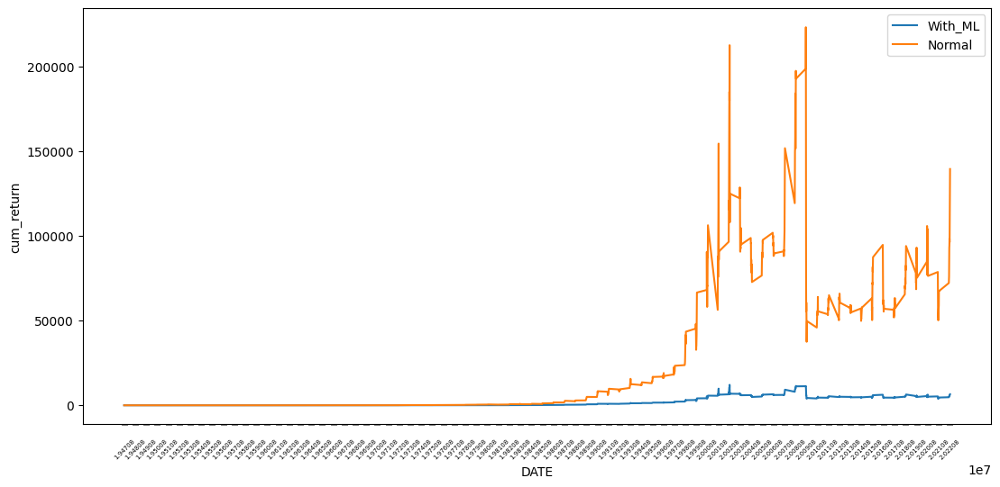

In [25]:
GBC_F_CUM_RETURN_dynamic = TML.cumm_return_by_dynamic(Fixed_GBC_Result, WML, 'GBC_PROB_POS_WML', plot=True)

### XGB

**************************************************

XGB Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : None
 

  0%|          | 0/905 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.33      0.38       315
         1.0       0.68      0.77      0.73       590

    accuracy                           0.62       905
   macro avg       0.56      0.55      0.55       905
weighted avg       0.60      0.62      0.60       905


accuracy : 0.6187845303867403

precision : 0.6842105263157895

recall : 0.7711864406779662

F1-Score : 0.7250996015936256



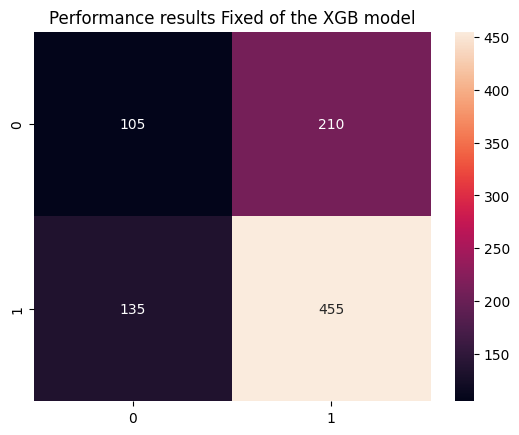


Feature Importance of the model



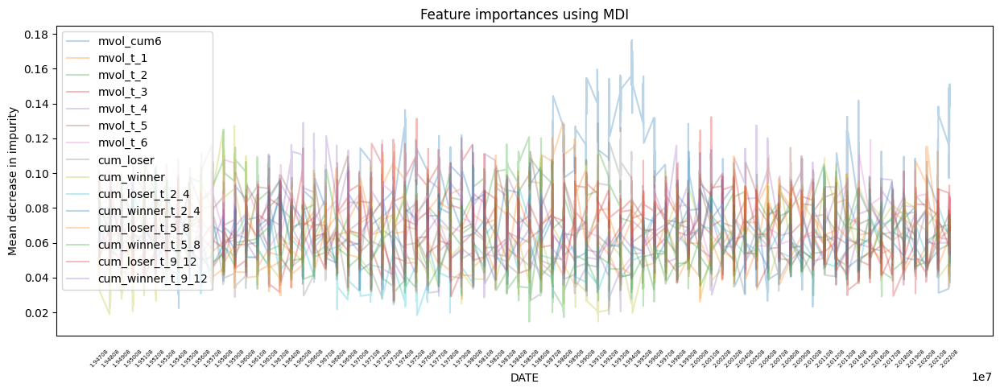

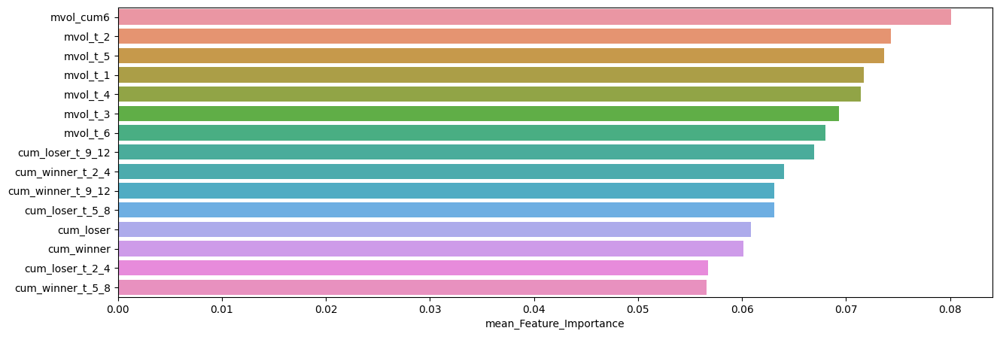

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.080077,0.176483,0.022431
mvol_t_2,0.074275,0.125240,0.029076
mvol_t_5,0.073631,0.116040,0.037315
mvol_t_1,0.071686,0.129146,0.034166
mvol_t_4,0.071420,0.127518,0.030859
mvol_t_3,0.069349,0.131351,0.031665
mvol_t_6,0.067992,0.119199,0.035734
cum_loser_t_9_12,0.066958,0.132292,0.026936
cum_winner_t_2_4,0.064071,0.128505,0.031194
cum_winner_t_9_12,0.063129,0.129001,0.018914


In [26]:
Fixed_XGB_Result = TML.Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                      model=XGB, # 사용할 모델
                                      model_name='XGB', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470829 ~ 19660531

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.35      0.37        75
         1.0       0.70      0.75      0.72       151

    accuracy                           0.62       226
   macro avg       0.55      0.55      0.55       226
weighted avg       0.60      0.62      0.61       226


accuracy : 0.6150442477876106

precision : 0.6975308641975309

recall : 0.7483443708609272

F1-Score : 0.7220447284345048



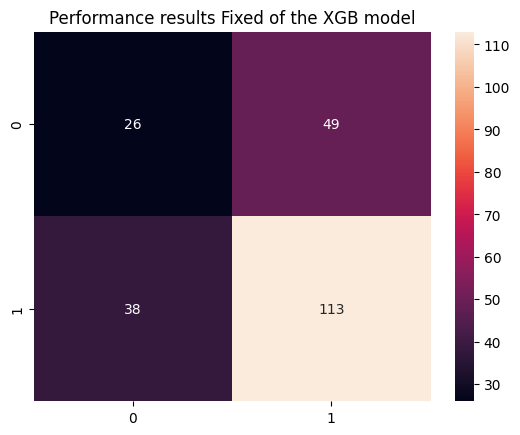


Feature Importance of the model



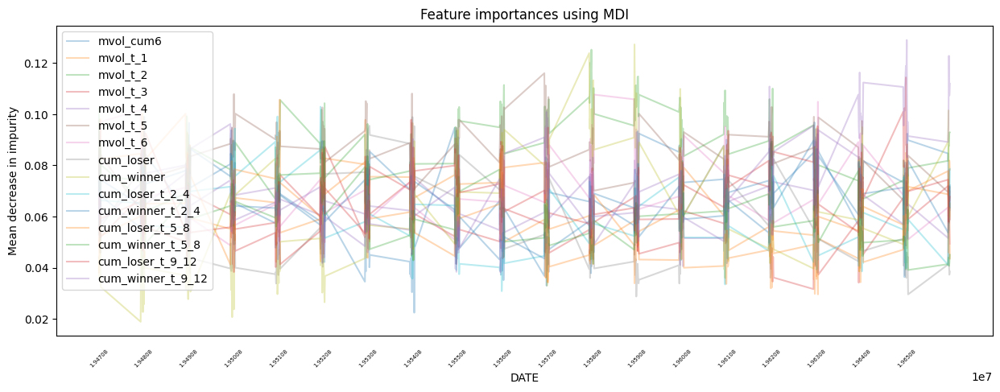

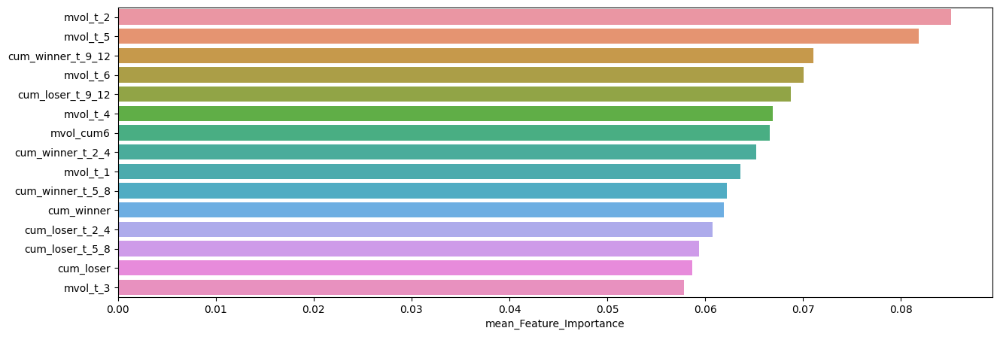

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.085103,0.125240,0.035160
mvol_t_5,0.081816,0.116040,0.045121
cum_winner_t_9_12,0.071055,0.129001,0.038281
mvol_t_6,0.070076,0.107671,0.043727
cum_loser_t_9_12,0.068784,0.114385,0.038312
mvol_t_4,0.066939,0.096180,0.040596
mvol_cum6,0.066600,0.098978,0.022431
cum_winner_t_2_4,0.065198,0.090364,0.032966
mvol_t_1,0.063587,0.100259,0.034166
cum_winner_t_5_8,0.062234,0.102114,0.039119



**************************************************

DATE : 19660630 ~ 19850329

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.47      0.38      0.42        74
         1.0       0.72      0.79      0.75       152

    accuracy                           0.65       226
   macro avg       0.59      0.58      0.59       226
weighted avg       0.64      0.65      0.64       226


accuracy : 0.6548672566371682

precision : 0.7228915662650602

recall : 0.7894736842105263

F1-Score : 0.7547169811320756



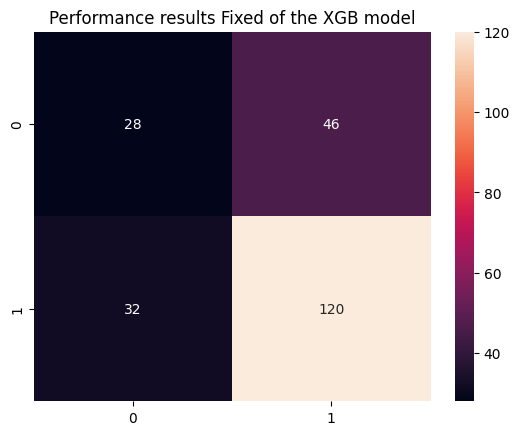


Feature Importance of the model



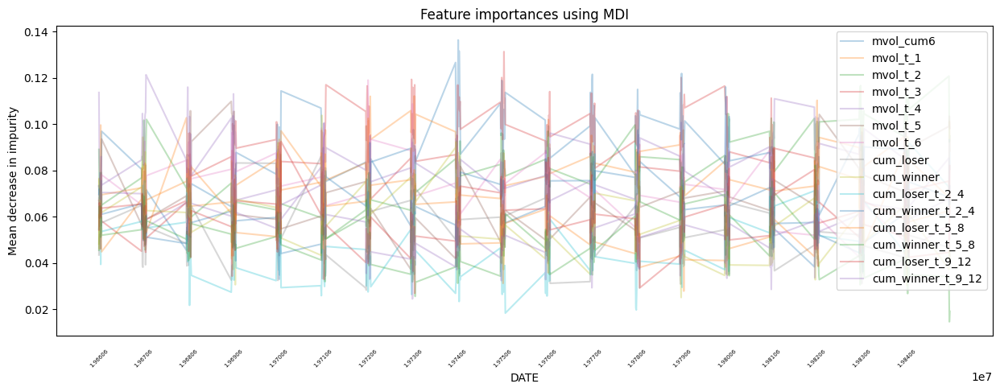

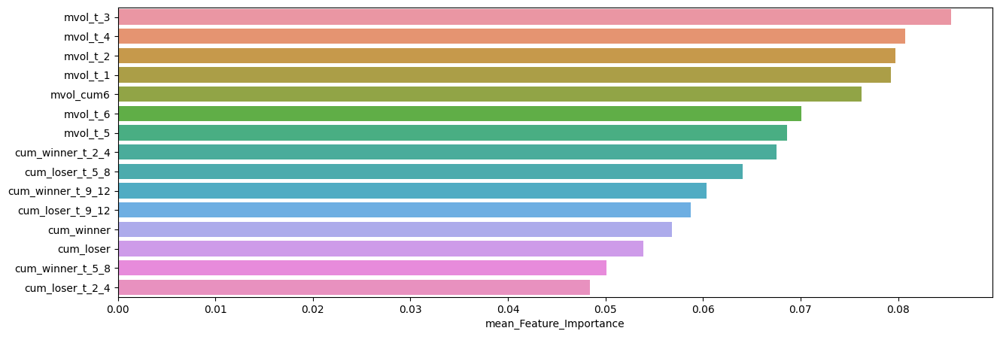

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.085418,0.131351,0.042505
mvol_t_4,0.080732,0.113088,0.055454
mvol_t_2,0.079738,0.120786,0.045445
mvol_t_1,0.079258,0.112165,0.048026
mvol_cum6,0.076266,0.136355,0.036261
mvol_t_6,0.070114,0.119043,0.037603
mvol_t_5,0.068612,0.109840,0.037315
cum_winner_t_2_4,0.067529,0.121895,0.032990
cum_loser_t_5_8,0.064039,0.110295,0.027859
cum_winner_t_9_12,0.060377,0.121342,0.024504



**************************************************

DATE : 19850430 ~ 20040130

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.43      0.26      0.32        70
         1.0       0.72      0.85      0.78       156

    accuracy                           0.66       226
   macro avg       0.57      0.55      0.55       226
weighted avg       0.63      0.66      0.64       226


accuracy : 0.6637168141592921

precision : 0.717391304347826

recall : 0.8461538461538461

F1-Score : 0.776470588235294



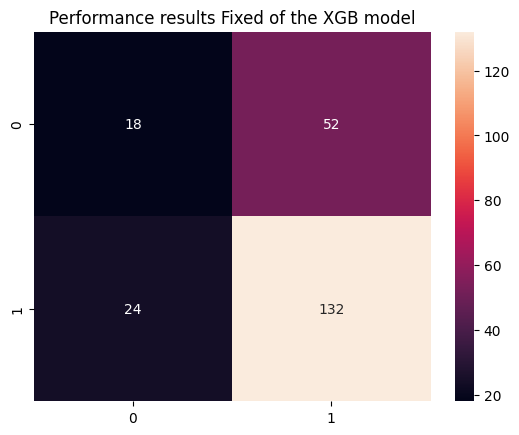


Feature Importance of the model



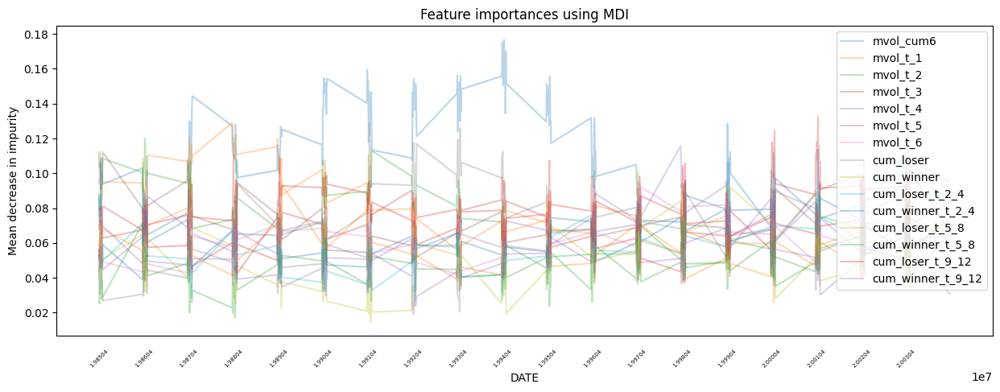

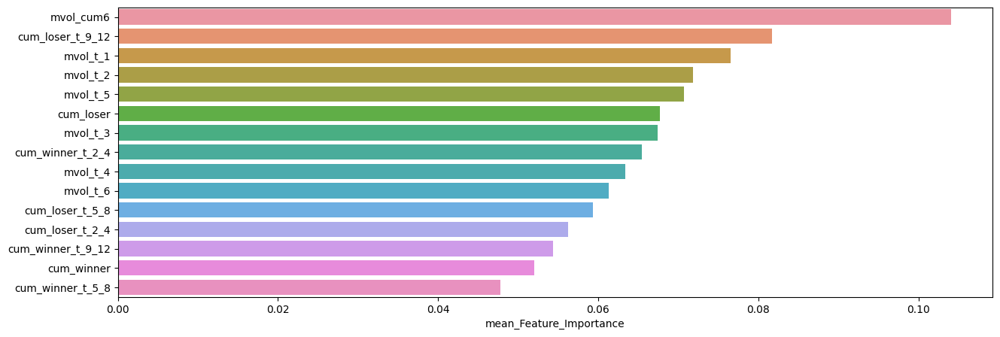

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.104063,0.176483,0.034810
cum_loser_t_9_12,0.081747,0.132292,0.042535
mvol_t_1,0.076545,0.129146,0.036357
mvol_t_2,0.071865,0.120041,0.033211
mvol_t_5,0.070725,0.112281,0.044180
cum_loser,0.067729,0.128618,0.026809
mvol_t_3,0.067419,0.101857,0.036823
cum_winner_t_2_4,0.065479,0.128505,0.036580
mvol_t_4,0.063405,0.115899,0.030859
mvol_t_6,0.061292,0.099952,0.035734



**************************************************

DATE : 20040227 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.45      0.34      0.39        96
         1.0       0.59      0.69      0.63       131

    accuracy                           0.54       227
   macro avg       0.52      0.52      0.51       227
weighted avg       0.53      0.54      0.53       227


accuracy : 0.5418502202643172

precision : 0.5882352941176471

recall : 0.6870229007633588

F1-Score : 0.6338028169014084



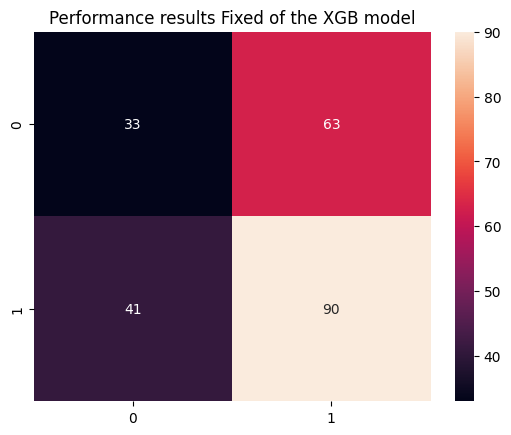


Feature Importance of the model



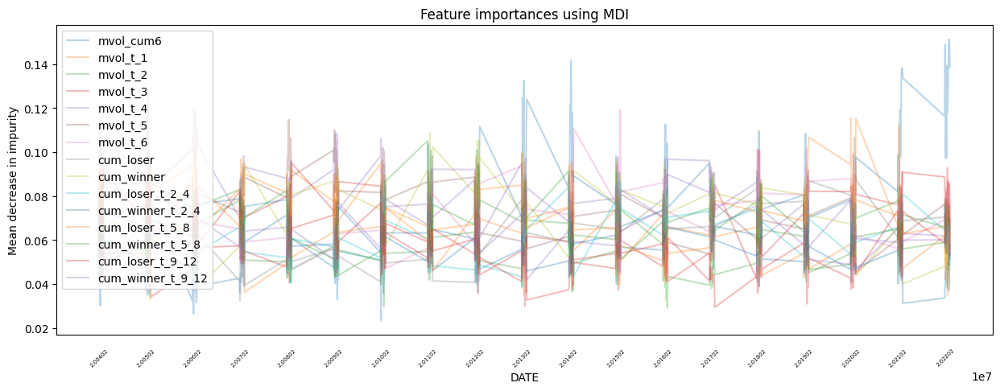

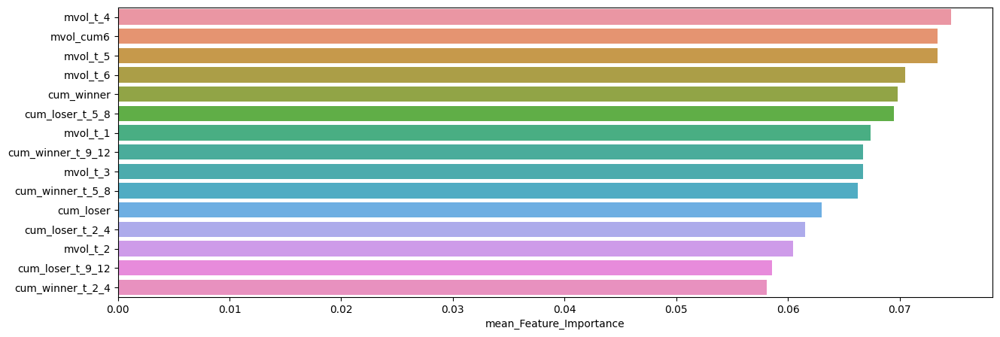

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_4,0.074591,0.127518,0.040380
mvol_cum6,0.073410,0.151193,0.023195
mvol_t_5,0.073370,0.114700,0.045653
mvol_t_6,0.070476,0.119199,0.040651
cum_winner,0.069827,0.108820,0.032953
cum_loser_t_5_8,0.069492,0.115314,0.034928
mvol_t_1,0.067372,0.108415,0.036317
cum_winner_t_9_12,0.066734,0.097609,0.041621
mvol_t_3,0.066726,0.101003,0.034095
cum_winner_t_5_8,0.066284,0.105091,0.040402


In [27]:
TML.slice_feature_importance(Fixed_XGB_Result, 4, 'Fixed', 'XGB')

Sharpe Ratio : 0.62398

최근 누적 수익률

  2022년-12월 -> 35422.05
  2022년-11월 -> 35422.05
  2022년-10월 -> 35422.05
  2022년-09월 -> 31365.66
  2022년-08월 -> 31365.66

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 121948.86
  2등 : 2002년-06월 -> 106191.52
  3등 : 2002년-07월 -> 106191.52
  4등 : 2002년-08월 -> 103115.03
  5등 : 2001년-09월 -> 98789.16
  6등 : 2002년-10월 -> 98394.66
  7등 : 2008년-08월 -> 96558.80
  8등 : 2008년-11월 -> 96558.80
  9등 : 2008년-10월 -> 96558.80
  10등 : 2008년-09월 -> 96558.80



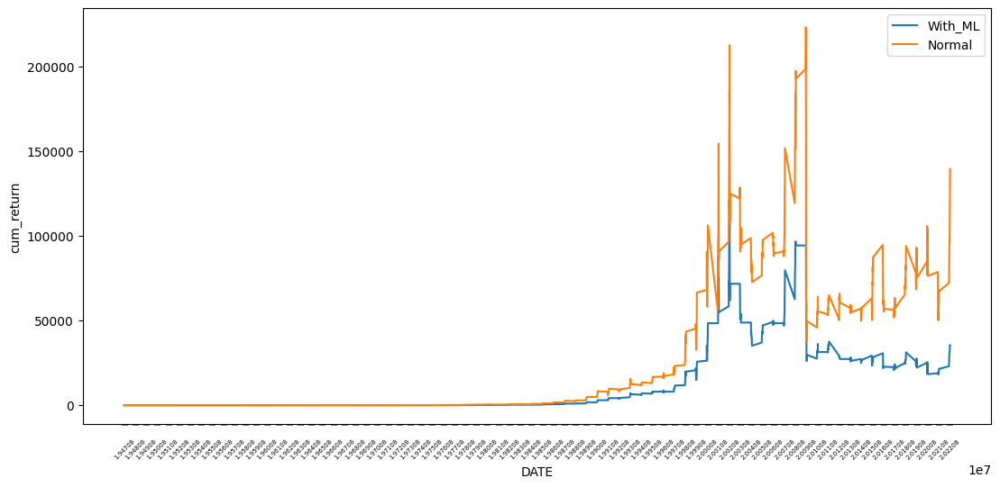

In [28]:
XGB_F_CUM_RETURN_static = TML.cumm_return_by_dynamic(Fixed_XGB_Result, WML, 'XGB_PRED_POS_WML', plot=True)

Sharpe Ratio : 0.70400

최근 누적 수익률

  2022년-12월 -> 20845.57
  2022년-11월 -> 20533.15
  2022년-10월 -> 20477.95
  2022년-09월 -> 18592.96
  2022년-08월 -> 18091.29

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 43686.76
  2등 : 2009년-02월 -> 40365.40
  3등 : 2008년-11월 -> 39585.31
  4등 : 2009년-01월 -> 39424.90
  5등 : 2008년-10월 -> 39219.20
  6등 : 2008년-12월 -> 38910.22
  7등 : 2008년-06월 -> 38774.88
  8등 : 2008년-09월 -> 38453.03
  9등 : 2008년-07월 -> 38342.89
  10등 : 2008년-08월 -> 38235.95



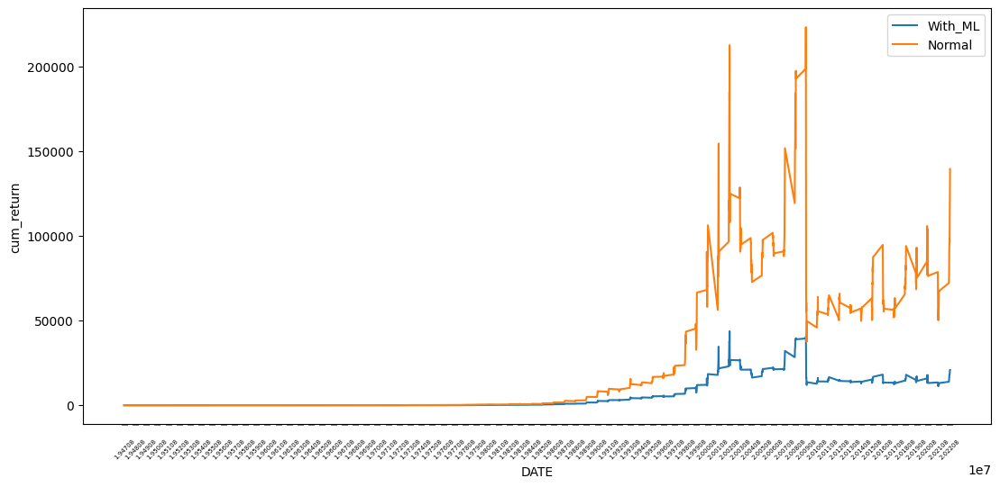

In [29]:
XGB_F_CUM_RETURN_dynamic = TML.cumm_return_by_dynamic(Fixed_XGB_Result, WML, 'XGB_PROB_POS_WML', plot=True)

## Expanding

### Random Forest

**************************************************

RDF Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/905 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.17      0.25       315
         1.0       0.66      0.87      0.75       590

    accuracy                           0.63       905
   macro avg       0.54      0.52      0.50       905
weighted avg       0.58      0.63      0.58       905


accuracy : 0.6265193370165746

precision : 0.6632124352331606

recall : 0.8677966101694915

F1-Score : 0.7518355359765051



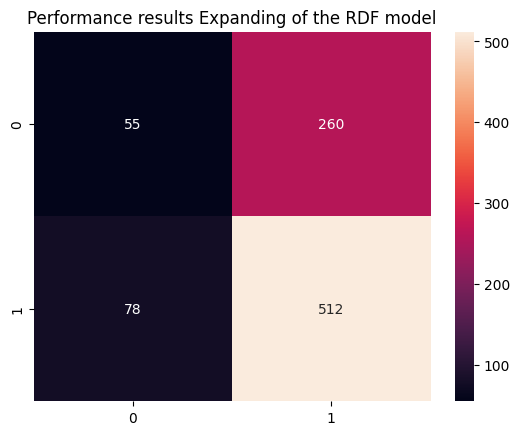


Feature Importance of the model



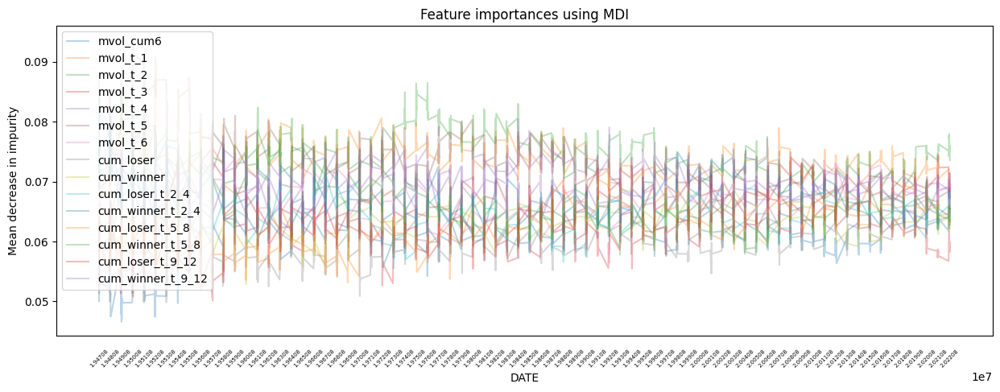

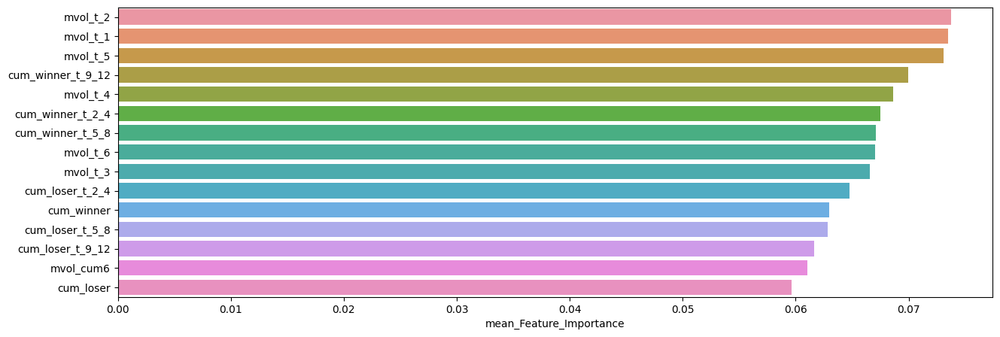

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.073736,0.086492,0.057529
mvol_t_1,0.073509,0.087151,0.066192
mvol_t_5,0.073121,0.093633,0.063911
cum_winner_t_9_12,0.069944,0.080474,0.059452
mvol_t_4,0.068609,0.081058,0.060884
cum_winner_t_2_4,0.067520,0.080849,0.058152
cum_winner_t_5_8,0.067076,0.085015,0.057816
mvol_t_6,0.066999,0.084579,0.056476
mvol_t_3,0.066555,0.075707,0.052820
cum_loser_t_2_4,0.064785,0.083911,0.055507


In [30]:
Expanding_RDF_Result = TML.Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=RDF, # 사용할 모델
                                      model_name='RDF', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470829 ~ 19660531

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.24      0.30        75
         1.0       0.69      0.83      0.75       151

    accuracy                           0.63       226
   macro avg       0.55      0.53      0.53       226
weighted avg       0.59      0.63      0.60       226


accuracy : 0.6327433628318584

precision : 0.6868131868131868

recall : 0.8278145695364238

F1-Score : 0.7507507507507508



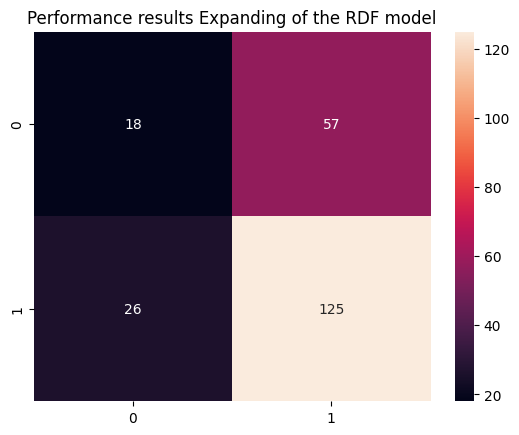


Feature Importance of the model



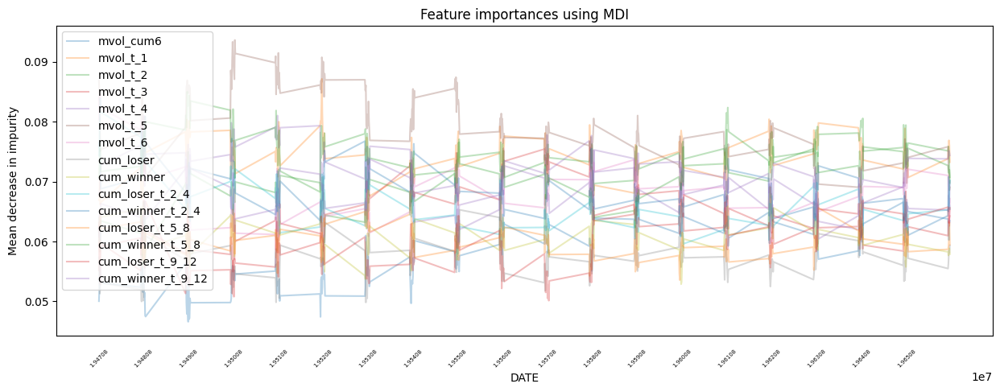

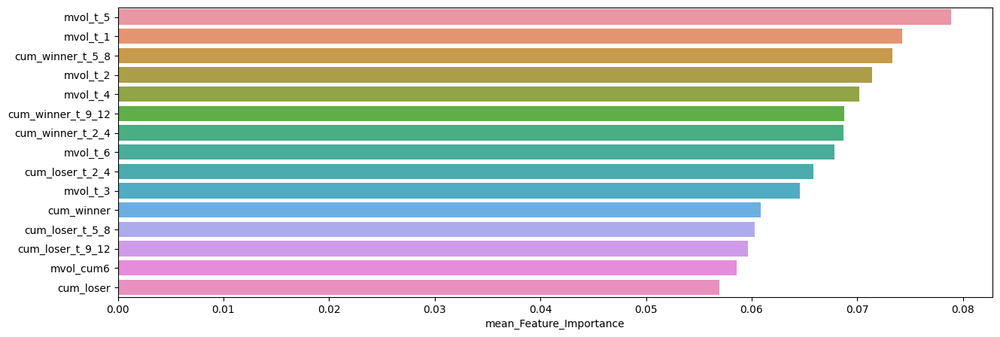

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.078860,0.093633,0.068365
mvol_t_1,0.074226,0.087151,0.066192
cum_winner_t_5_8,0.073297,0.085015,0.062337
mvol_t_2,0.071417,0.082356,0.057529
mvol_t_4,0.070192,0.081058,0.060884
cum_winner_t_9_12,0.068733,0.075528,0.059452
cum_winner_t_2_4,0.068658,0.080849,0.060715
mvol_t_6,0.067865,0.084579,0.058637
cum_loser_t_2_4,0.065850,0.083911,0.057931
mvol_t_3,0.064565,0.075707,0.052820



**************************************************

DATE : 19660630 ~ 19850329

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.32      0.12      0.18        74
         1.0       0.67      0.88      0.76       152

    accuracy                           0.63       226
   macro avg       0.50      0.50      0.47       226
weighted avg       0.56      0.63      0.57       226


accuracy : 0.6283185840707964

precision : 0.6717171717171717

recall : 0.875

F1-Score : 0.7600000000000001



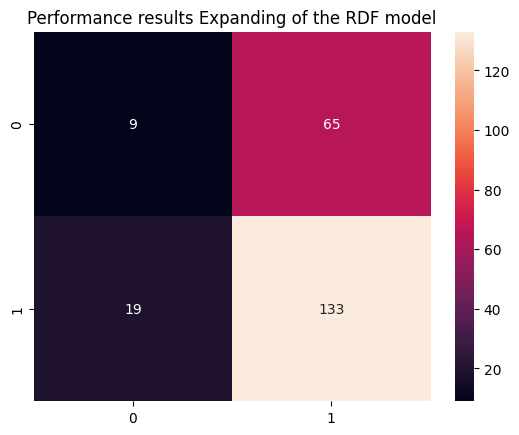


Feature Importance of the model



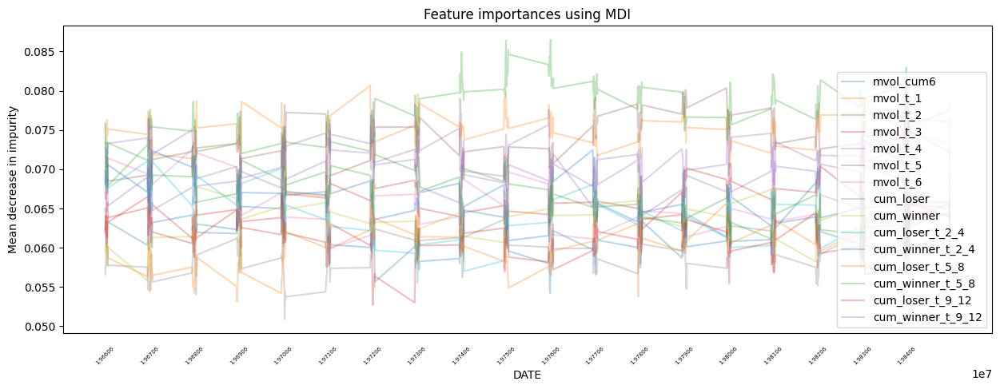

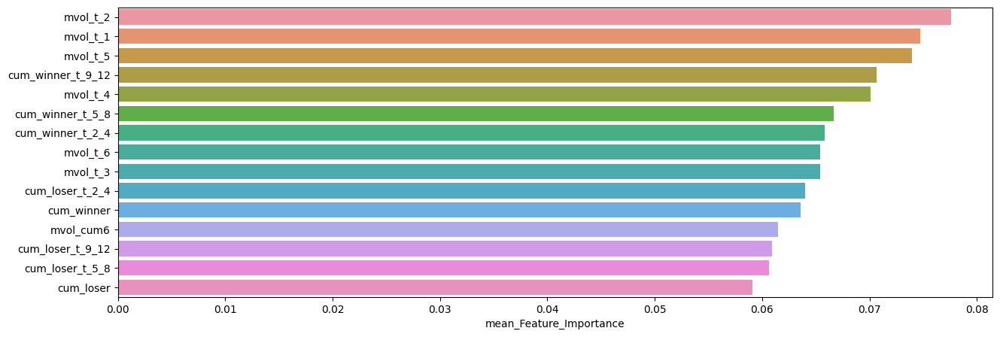

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.077574,0.086492,0.068885
mvol_t_1,0.074698,0.080637,0.066600
mvol_t_5,0.073961,0.080334,0.065726
cum_winner_t_9_12,0.070660,0.080474,0.063750
mvol_t_4,0.070081,0.078577,0.063810
cum_winner_t_5_8,0.066665,0.076537,0.059486
cum_winner_t_2_4,0.065836,0.072459,0.058152
mvol_t_6,0.065419,0.072869,0.059423
mvol_t_3,0.065416,0.070762,0.059142
cum_loser_t_2_4,0.063988,0.072517,0.055507



**************************************************

DATE : 19850430 ~ 20040130

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.13      0.20        70
         1.0       0.70      0.92      0.79       156

    accuracy                           0.67       226
   macro avg       0.56      0.52      0.50       226
weighted avg       0.61      0.67      0.61       226


accuracy : 0.672566371681416

precision : 0.7009803921568627

recall : 0.9166666666666666

F1-Score : 0.7944444444444444



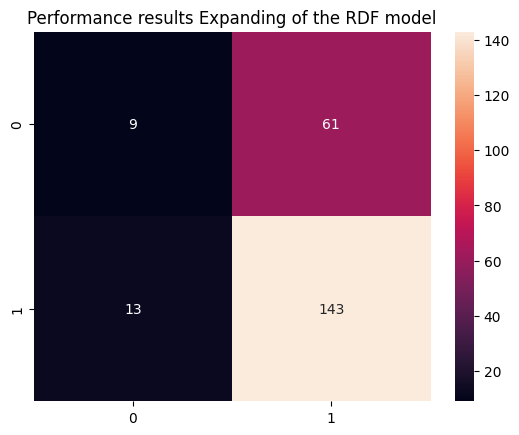


Feature Importance of the model



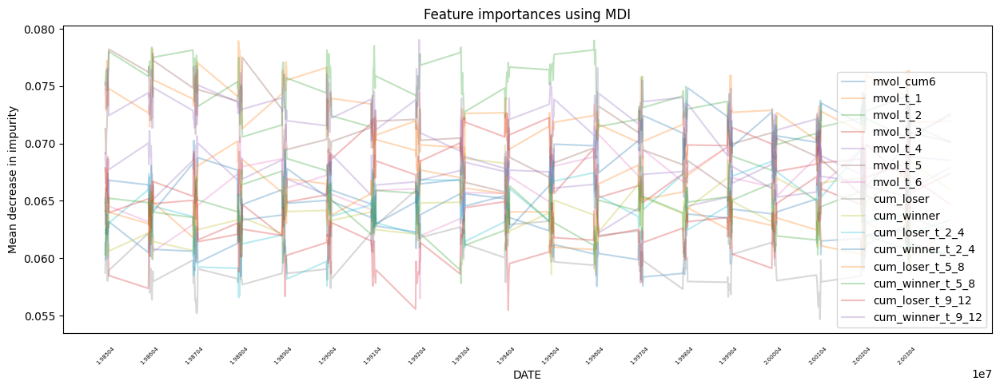

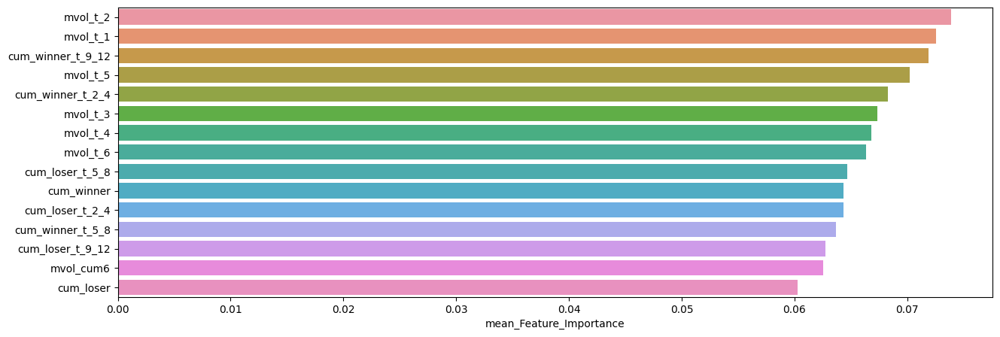

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.073873,0.078989,0.067629
mvol_t_1,0.072573,0.078958,0.067009
cum_winner_t_9_12,0.071872,0.079041,0.063762
mvol_t_5,0.070215,0.078225,0.063911
cum_winner_t_2_4,0.068266,0.075394,0.061392
mvol_t_3,0.067351,0.072663,0.057365
mvol_t_4,0.066837,0.072041,0.062204
mvol_t_6,0.066355,0.073661,0.056476
cum_loser_t_5_8,0.064669,0.071974,0.058661
cum_winner,0.064379,0.070324,0.058575



**************************************************

DATE : 20040227 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.49      0.20      0.28        96
         1.0       0.59      0.85      0.70       131

    accuracy                           0.57       227
   macro avg       0.54      0.52      0.49       227
weighted avg       0.55      0.57      0.52       227


accuracy : 0.5726872246696035

precision : 0.5904255319148937

recall : 0.8473282442748091

F1-Score : 0.6959247648902821



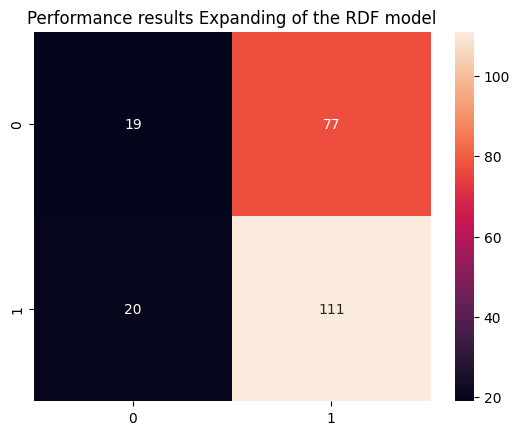


Feature Importance of the model



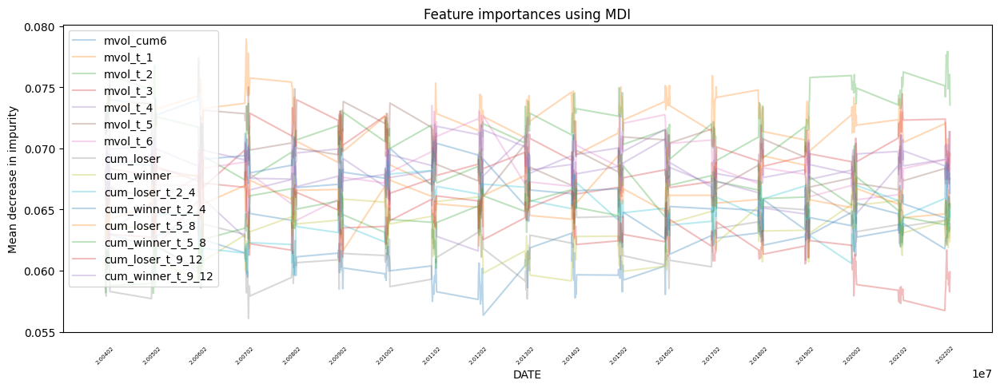

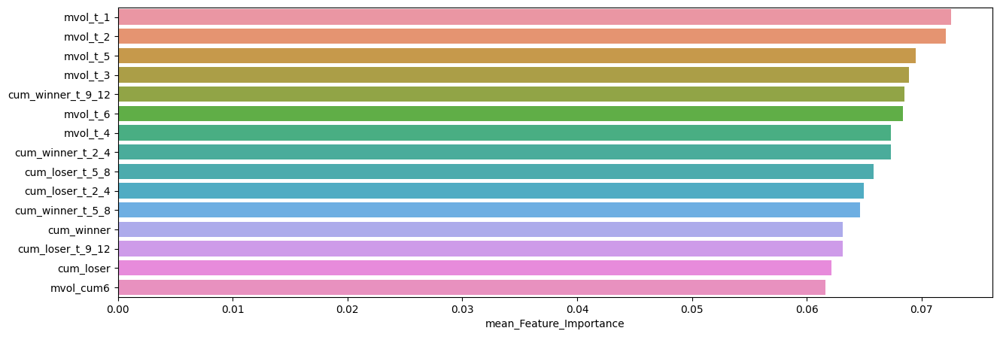

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.072544,0.078958,0.067083
mvol_t_2,0.072089,0.077946,0.067116
mvol_t_5,0.069464,0.075032,0.065631
mvol_t_3,0.068878,0.074472,0.063754
cum_winner_t_9_12,0.068516,0.072779,0.063211
mvol_t_6,0.068351,0.073536,0.062576
mvol_t_4,0.067331,0.071564,0.061616
cum_winner_t_2_4,0.067323,0.077469,0.061918
cum_loser_t_5_8,0.065820,0.070026,0.060188
cum_loser_t_2_4,0.064970,0.069785,0.059629


In [31]:
TML.slice_feature_importance(Expanding_RDF_Result, 4, 'Expanding', 'RDF')

Sharpe Ratio : 0.71155

최근 누적 수익률

  2022년-12월 -> 65007.38
  2022년-11월 -> 65007.38
  2022년-10월 -> 61835.69
  2022년-09월 -> 54754.60
  2022년-08월 -> 49779.99

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-07월 -> 76664.61
  2등 : 2002년-09월 -> 74443.54
  3등 : 2002년-08월 -> 74443.54
  4등 : 2002년-06월 -> 72688.28
  5등 : 2008년-11월 -> 71715.64
  6등 : 2009년-03월 -> 70018.18
  7등 : 2008년-12월 -> 70018.18
  8등 : 2009년-01월 -> 70018.18
  9등 : 2009년-02월 -> 70018.18
  10등 : 2008년-10월 -> 65398.58



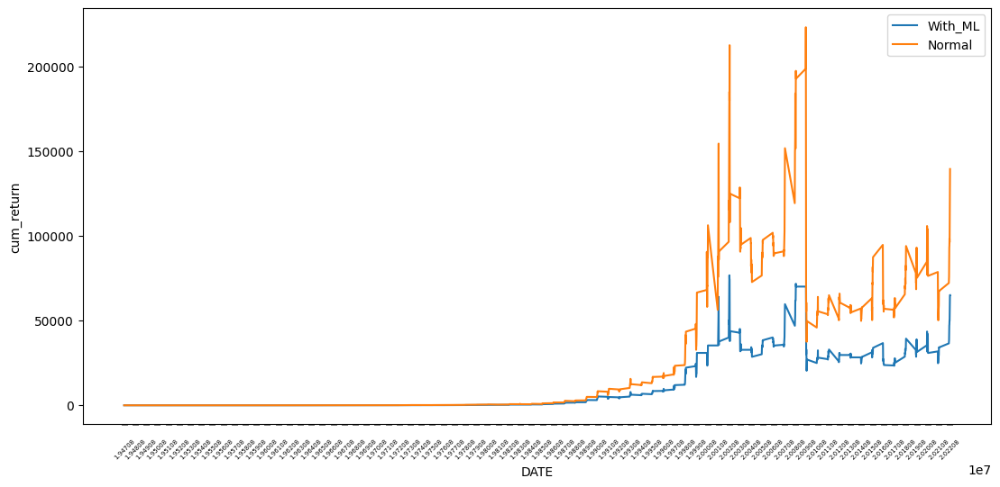

In [32]:
RDF_E_CUM_RETURN_static = TML.cumm_return_by_dynamic(Expanding_RDF_Result, WML, 'RDF_PRED_POS_WML', plot=True)

Sharpe Ratio : 0.72810

최근 누적 수익률

  2022년-12월 -> 8521.01
  2022년-11월 -> 8093.99
  2022년-10월 -> 7879.75
  2022년-09월 -> 7217.01
  2022년-08월 -> 6840.96

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 8521.01
  2등 : 2009년-02월 -> 8354.59
  3등 : 2022년-11월 -> 8093.99
  4등 : 2008년-11월 -> 8070.60
  5등 : 2009년-01월 -> 8057.13
  6등 : 2008년-12월 -> 7973.17
  7등 : 2022년-10월 -> 7879.75
  8등 : 2008년-10월 -> 7593.77
  9등 : 2008년-06월 -> 7506.00
  10등 : 2008년-09월 -> 7333.04



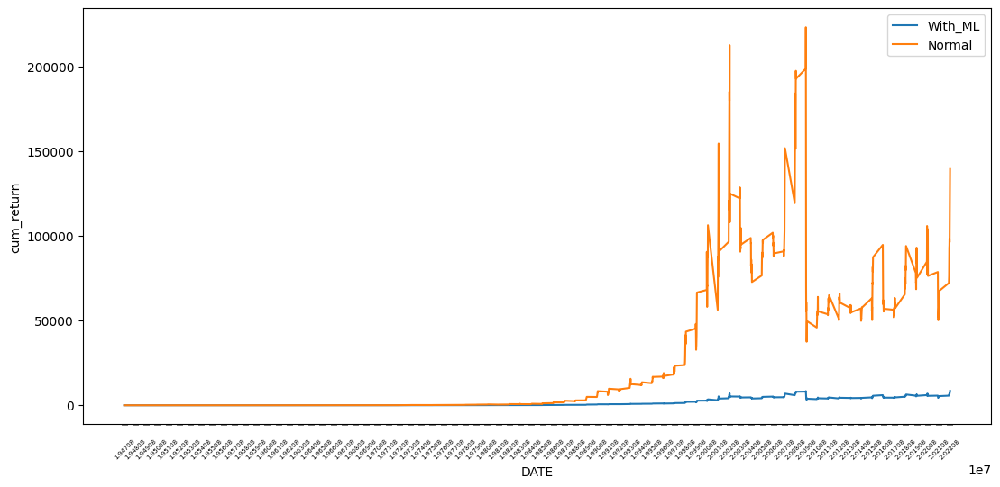

In [33]:
RDF_E_CUM_RETURN_dynamic = TML.cumm_return_by_dynamic(Expanding_RDF_Result, WML, 'RDF_PROB_POS_WML', plot=True)

### Gradient Boosting

**************************************************

GBC Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/905 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.23      0.29       315
         1.0       0.67      0.83      0.74       590

    accuracy                           0.62       905
   macro avg       0.54      0.53      0.52       905
weighted avg       0.58      0.62      0.58       905


accuracy : 0.6198895027624309

precision : 0.667574931880109

recall : 0.8305084745762712

F1-Score : 0.7401812688821753



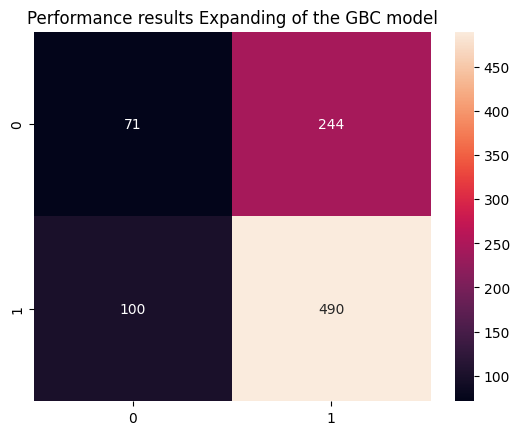


Feature Importance of the model



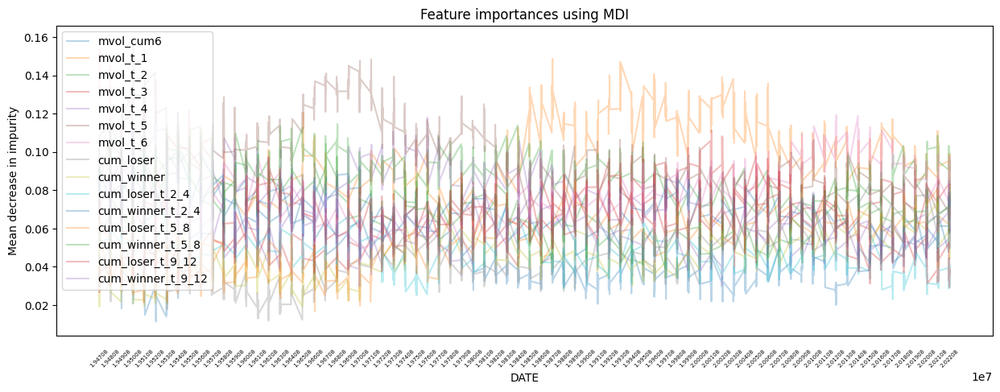

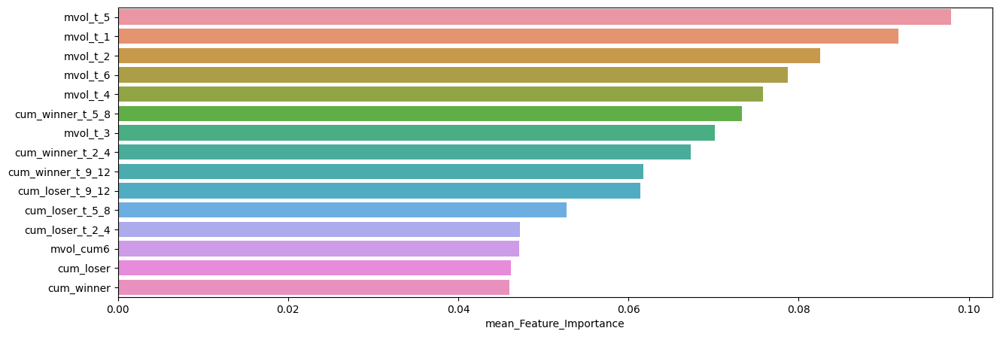

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.097888,0.158514,0.064257
mvol_t_1,0.091763,0.148704,0.032114
mvol_t_2,0.082485,0.113931,0.041838
mvol_t_6,0.078717,0.154410,0.042103
mvol_t_4,0.075839,0.118003,0.039579
cum_winner_t_5_8,0.073338,0.115060,0.038883
mvol_t_3,0.070175,0.121512,0.034480
cum_winner_t_2_4,0.067277,0.120992,0.037528
cum_winner_t_9_12,0.061732,0.125078,0.029888
cum_loser_t_9_12,0.061422,0.097604,0.026733


In [34]:
Expanding_GBC_Result = TML.Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=GBC, # 사용할 모델
                                      model_name='GBC', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470829 ~ 19660531

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.31      0.34        75
         1.0       0.68      0.74      0.71       151

    accuracy                           0.60       226
   macro avg       0.53      0.52      0.52       226
weighted avg       0.58      0.60      0.59       226


accuracy : 0.5973451327433629

precision : 0.6829268292682927

recall : 0.7417218543046358

F1-Score : 0.7111111111111112



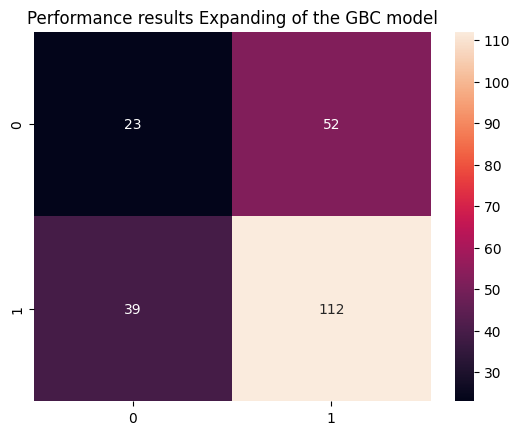


Feature Importance of the model



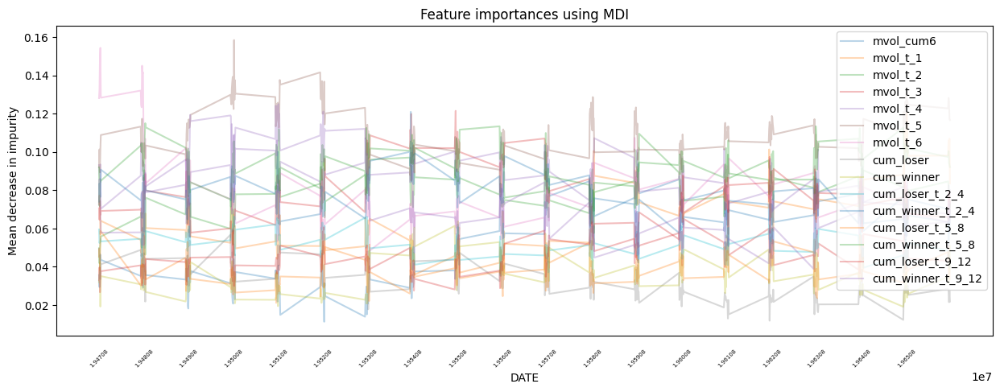

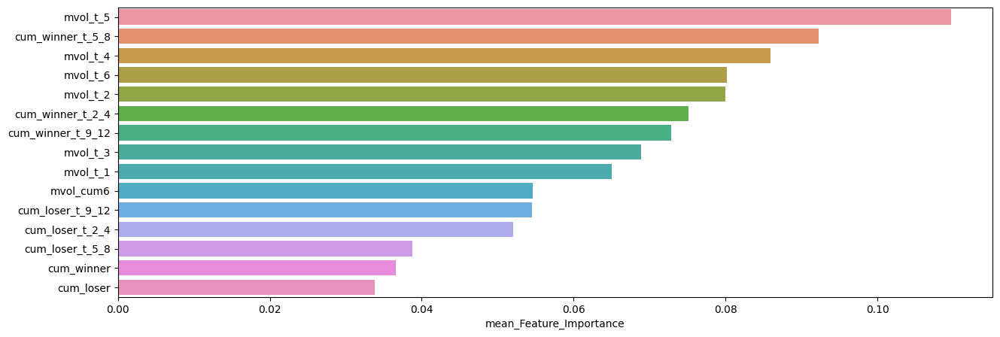

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.109648,0.158514,0.079048
cum_winner_t_5_8,0.092242,0.115060,0.057606
mvol_t_4,0.085949,0.114585,0.063410
mvol_t_6,0.080134,0.154410,0.048538
mvol_t_2,0.080007,0.109547,0.041838
cum_winner_t_2_4,0.075116,0.120992,0.042089
cum_winner_t_9_12,0.072807,0.125078,0.038127
mvol_t_3,0.068836,0.121512,0.036449
mvol_t_1,0.065053,0.120445,0.032114
mvol_cum6,0.054617,0.093824,0.011293



**************************************************

DATE : 19660630 ~ 19850329

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.26      0.31        74
         1.0       0.69      0.82      0.75       152

    accuracy                           0.63       226
   macro avg       0.55      0.54      0.53       226
weighted avg       0.60      0.63      0.61       226


accuracy : 0.6327433628318584

precision : 0.6927374301675978

recall : 0.8157894736842105

F1-Score : 0.7492447129909366



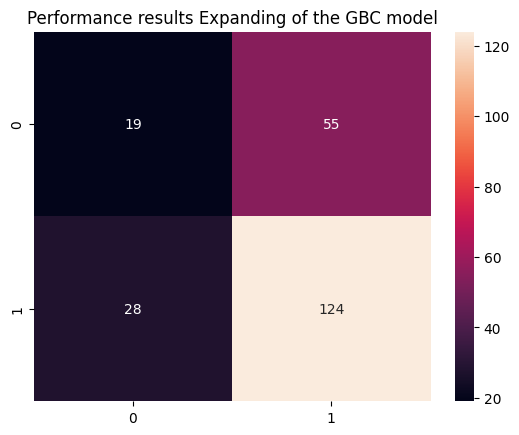


Feature Importance of the model



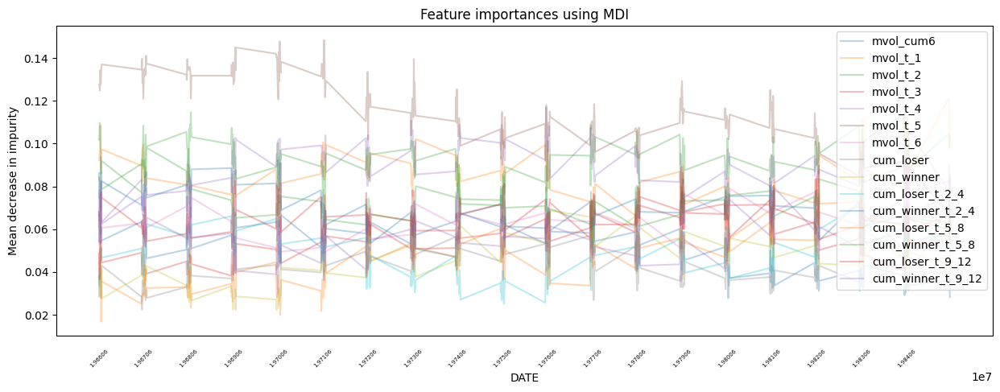

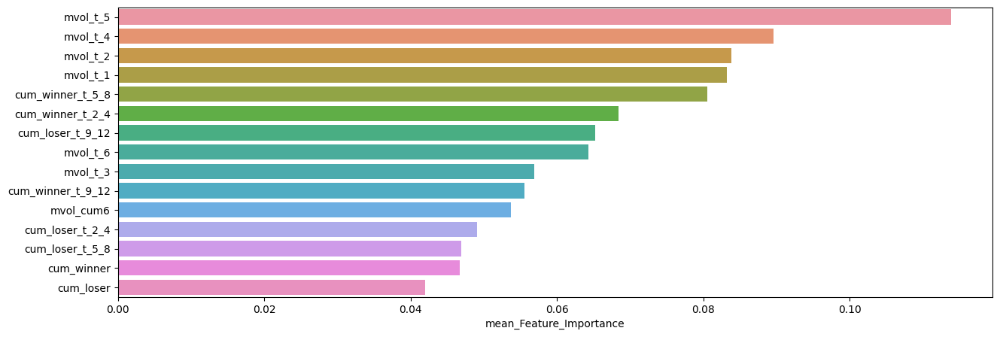

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.113837,0.148415,0.067298
mvol_t_4,0.089619,0.118003,0.063212
mvol_t_2,0.083864,0.113931,0.050079
mvol_t_1,0.083222,0.121237,0.054409
cum_winner_t_5_8,0.080524,0.114643,0.050893
cum_winner_t_2_4,0.068456,0.092351,0.042799
cum_loser_t_9_12,0.065227,0.089680,0.036558
mvol_t_6,0.064292,0.089459,0.042103
mvol_t_3,0.056882,0.084335,0.034480
cum_winner_t_9_12,0.055552,0.085801,0.029888



**************************************************

DATE : 19850430 ~ 20040130

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.16      0.23        70
         1.0       0.71      0.91      0.80       156

    accuracy                           0.68       226
   macro avg       0.57      0.53      0.51       226
weighted avg       0.62      0.68      0.62       226


accuracy : 0.6769911504424779

precision : 0.7064676616915423

recall : 0.9102564102564102

F1-Score : 0.7955182072829132



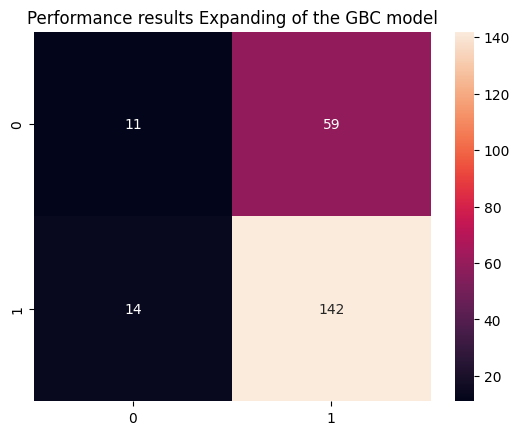


Feature Importance of the model



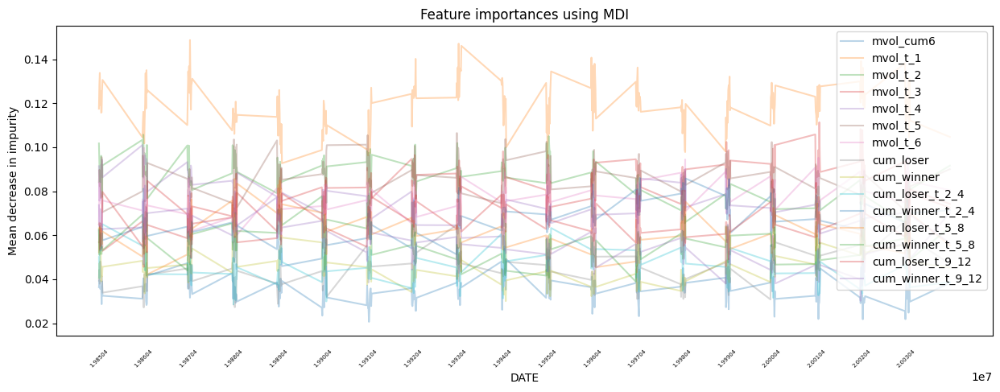

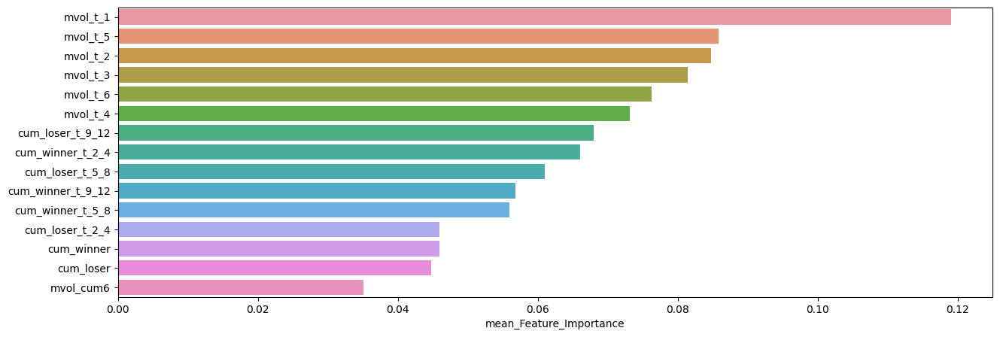

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.119030,0.148704,0.092724
mvol_t_5,0.085872,0.106481,0.065987
mvol_t_2,0.084742,0.105716,0.054338
mvol_t_3,0.081437,0.111373,0.052864
mvol_t_6,0.076262,0.099795,0.053254
mvol_t_4,0.073103,0.101019,0.049218
cum_loser_t_9_12,0.067956,0.088625,0.040194
cum_winner_t_2_4,0.066026,0.086038,0.044479
cum_loser_t_5_8,0.061048,0.085625,0.042190
cum_winner_t_9_12,0.056821,0.082576,0.030189



**************************************************

DATE : 20040227 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.49      0.19      0.27        96
         1.0       0.59      0.85      0.70       131

    accuracy                           0.57       227
   macro avg       0.54      0.52      0.48       227
weighted avg       0.55      0.57      0.52       227


accuracy : 0.5726872246696035

precision : 0.5894736842105263

recall : 0.8549618320610687

F1-Score : 0.6978193146417445



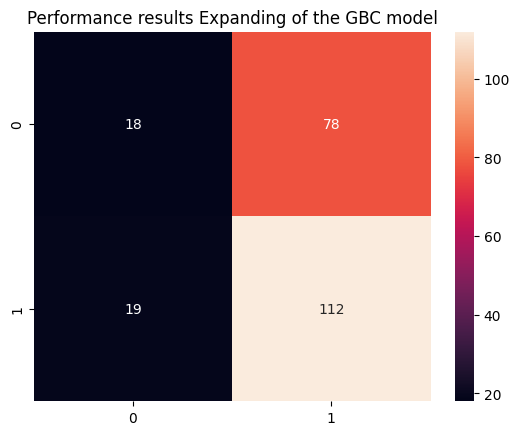


Feature Importance of the model



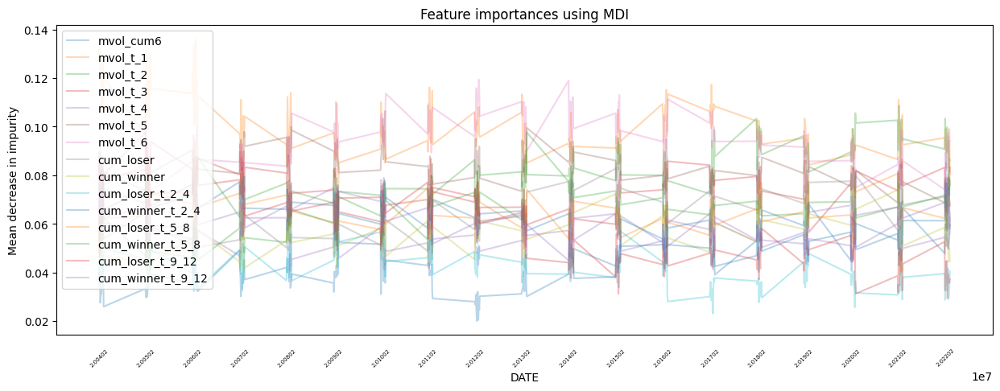

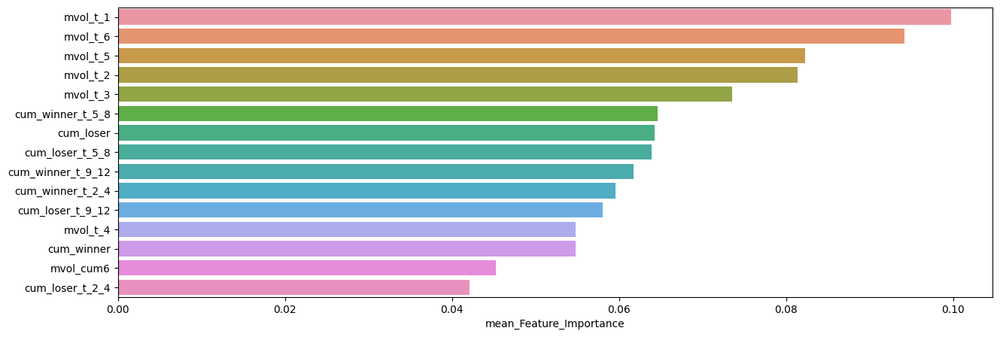

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.099711,0.135902,0.069472
mvol_t_6,0.094110,0.119367,0.066389
mvol_t_5,0.082264,0.106365,0.064257
mvol_t_2,0.081333,0.108570,0.057601
mvol_t_3,0.073532,0.093803,0.051119
cum_winner_t_5_8,0.064625,0.097676,0.040842
cum_loser,0.064263,0.085405,0.043147
cum_loser_t_5_8,0.063917,0.080600,0.047533
cum_winner_t_9_12,0.061747,0.085055,0.044904
cum_winner_t_2_4,0.059545,0.081300,0.037528


In [35]:
TML.slice_feature_importance(Expanding_GBC_Result, 4, 'Expanding', 'GBC')

Sharpe Ratio : 0.56235

최근 누적 수익률

  2022년-12월 -> 426301.62
  2022년-11월 -> 384090.20
  2022년-10월 -> 365350.83
  2022년-09월 -> 323513.39
  2022년-08월 -> 294121.73

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 426301.62
  2등 : 2022년-11월 -> 384090.20
  3등 : 2022년-10월 -> 365350.83
  4등 : 2022년-09월 -> 323513.39
  5등 : 2022년-08월 -> 294121.73
  6등 : 2022년-07월 -> 294121.73
  7등 : 2022년-06월 -> 294121.73
  8등 : 2022년-05월 -> 294121.73
  9등 : 2022년-04월 -> 275880.44
  10등 : 2021년-01월 -> 259955.24



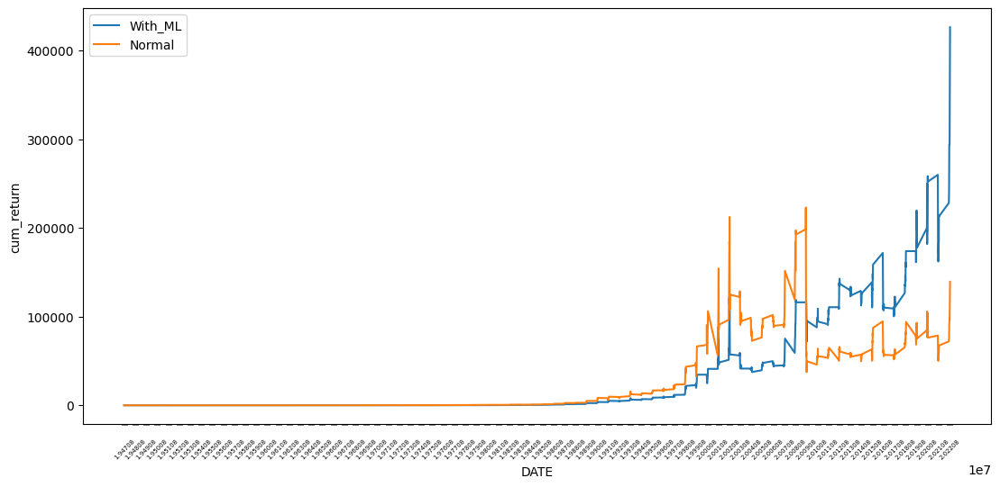

In [36]:
GBC_E_CUM_RETURN_static = TML.cumm_return_by_dynamic(Expanding_GBC_Result, WML, 'GBC_PRED_POS_WML', plot=True)

Sharpe Ratio : 0.70381

최근 누적 수익률

  2022년-12월 -> 20365.69
  2022년-11월 -> 18823.09
  2022년-10월 -> 18274.65
  2022년-09월 -> 16766.70
  2022년-08월 -> 15874.48

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 20365.69
  2등 : 2022년-11월 -> 18823.09
  3등 : 2022년-10월 -> 18274.65
  4등 : 2022년-09월 -> 16766.70
  5등 : 2022년-07월 -> 16036.27
  6등 : 2022년-08월 -> 15874.48
  7등 : 2020년-09월 -> 15848.69
  8등 : 2020년-10월 -> 15809.53
  9등 : 2020년-08월 -> 15794.75
  10등 : 2022년-06월 -> 15728.47



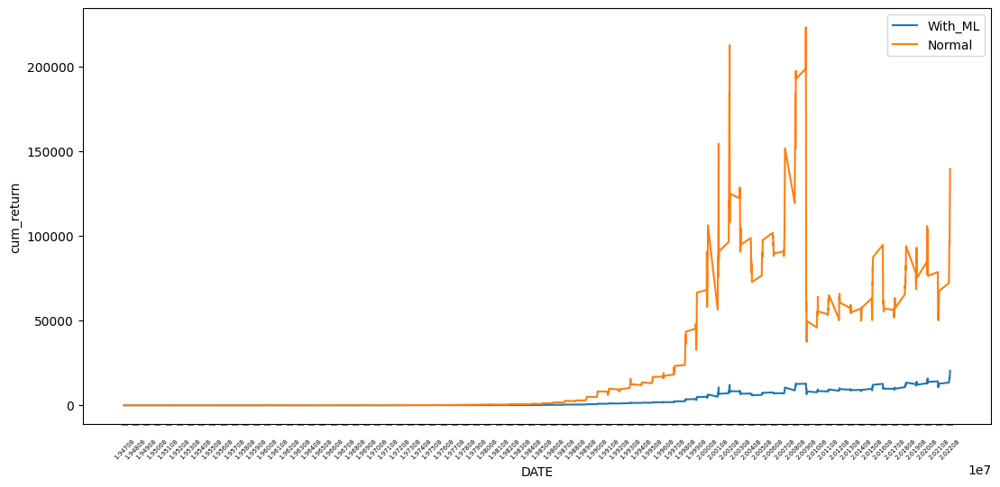

In [37]:
GBC_E_CUM_RETURN_dynamic = TML.cumm_return_by_dynamic(Expanding_GBC_Result, WML, 'GBC_PROB_POS_WML', plot=True)

### XGB

**************************************************

XGB Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : No

  0%|          | 0/905 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.30      0.35       315
         1.0       0.68      0.77      0.72       590

    accuracy                           0.61       905
   macro avg       0.55      0.54      0.54       905
weighted avg       0.58      0.61      0.59       905


accuracy : 0.6088397790055249

precision : 0.6750741839762612

recall : 0.7711864406779662

F1-Score : 0.7199367088607594



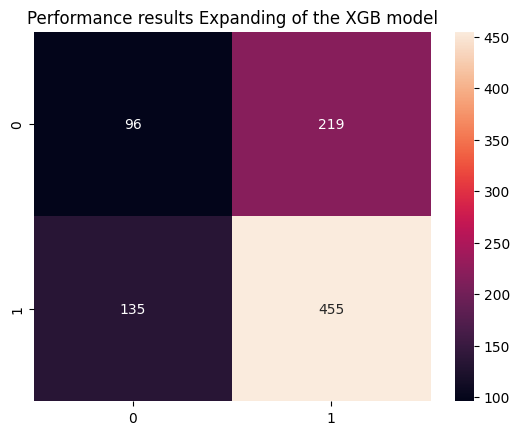


Feature Importance of the model



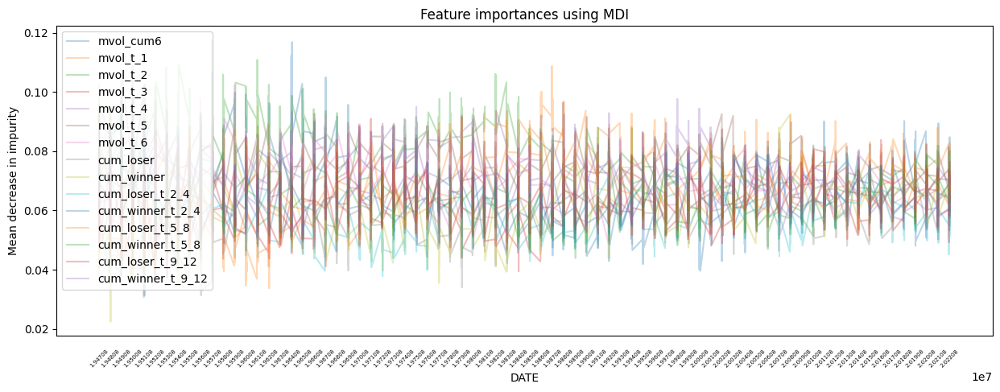

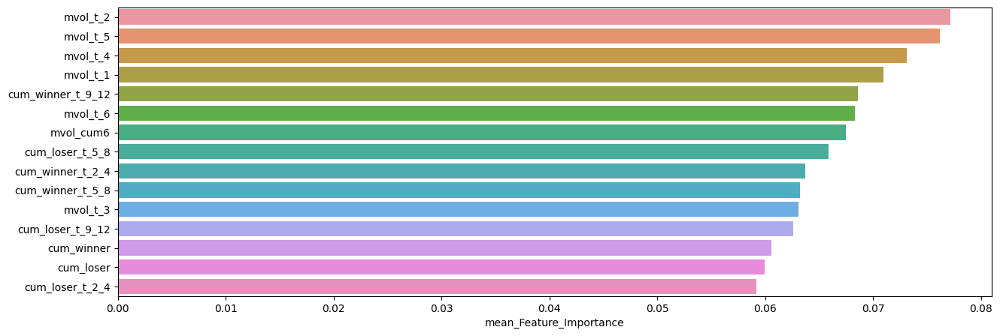

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.077148,0.117504,0.038973
mvol_t_5,0.076159,0.102634,0.050543
mvol_t_4,0.073139,0.106169,0.050700
mvol_t_1,0.070967,0.108714,0.041002
cum_winner_t_9_12,0.068613,0.093506,0.047734
mvol_t_6,0.068337,0.102361,0.042814
mvol_cum6,0.067469,0.116803,0.031293
cum_loser_t_5_8,0.065851,0.093653,0.033729
cum_winner_t_2_4,0.063700,0.089707,0.046737
cum_winner_t_5_8,0.063251,0.102114,0.043830


In [38]:
Expanding_XGB_Result = TML.Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=XGB, # 사용할 모델
                                      model_name='XGB', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470829 ~ 19660531

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.33      0.36        75
         1.0       0.69      0.74      0.71       151

    accuracy                           0.60       226
   macro avg       0.54      0.53      0.53       226
weighted avg       0.59      0.60      0.59       226


accuracy : 0.6017699115044248

precision : 0.6894409937888198

recall : 0.7350993377483444

F1-Score : 0.7115384615384615



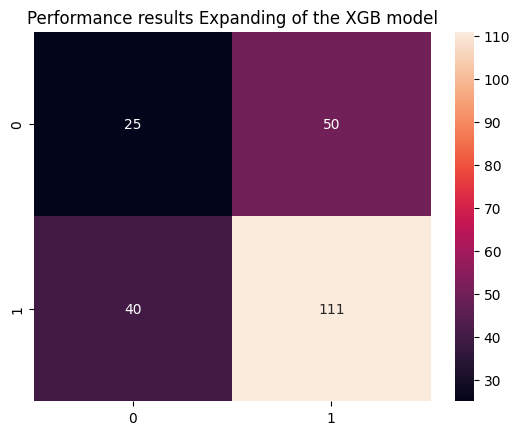


Feature Importance of the model



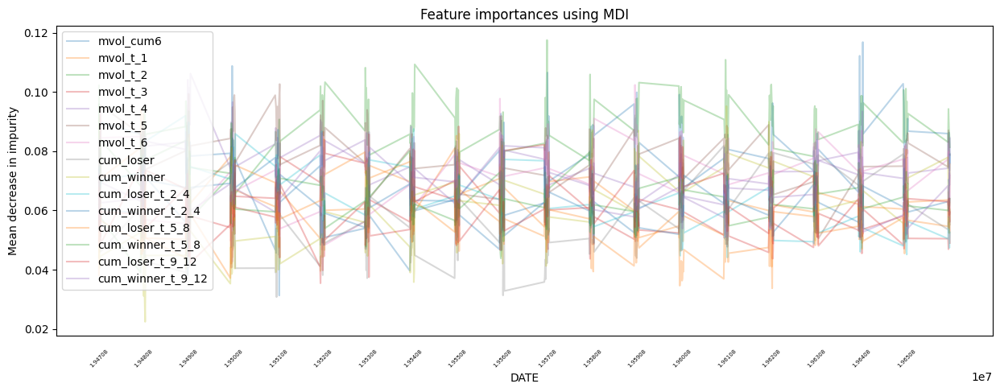

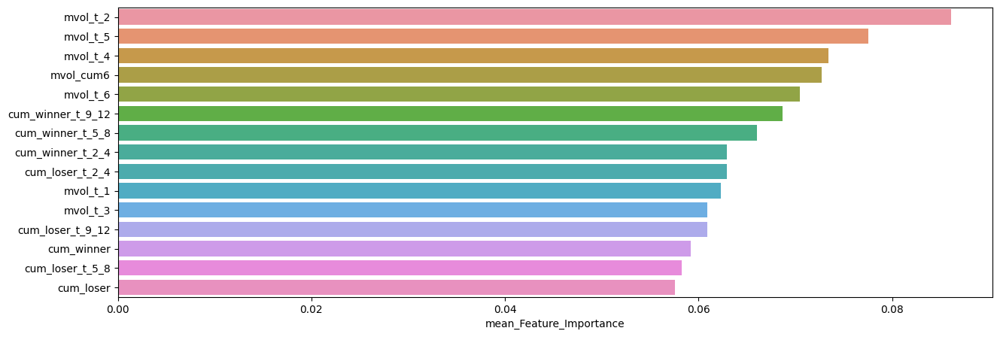

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.086082,0.117504,0.038973
mvol_t_5,0.077567,0.102634,0.050543
mvol_t_4,0.073424,0.106169,0.056279
mvol_cum6,0.072693,0.116803,0.031293
mvol_t_6,0.070464,0.102361,0.042814
cum_winner_t_9_12,0.068710,0.093389,0.051015
cum_winner_t_5_8,0.066031,0.102114,0.043830
cum_winner_t_2_4,0.062943,0.089707,0.046872
cum_loser_t_2_4,0.062937,0.091965,0.044111
mvol_t_1,0.062316,0.093950,0.041002



**************************************************

DATE : 19660630 ~ 19850329

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.35      0.38        74
         1.0       0.71      0.76      0.73       152

    accuracy                           0.62       226
   macro avg       0.56      0.55      0.55       226
weighted avg       0.61      0.62      0.62       226


accuracy : 0.6238938053097345

precision : 0.7055214723926381

recall : 0.756578947368421

F1-Score : 0.7301587301587301



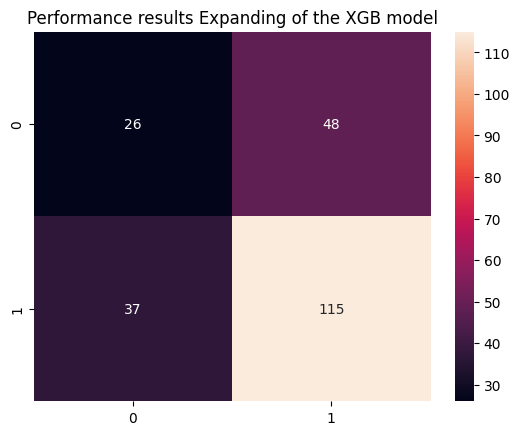


Feature Importance of the model



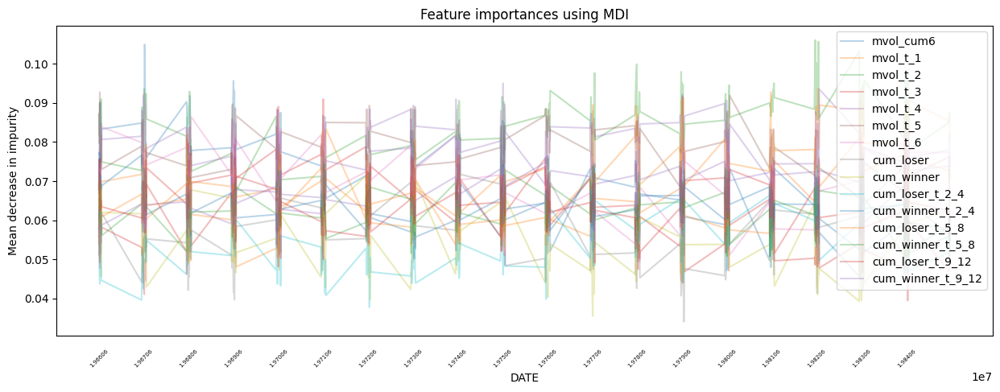

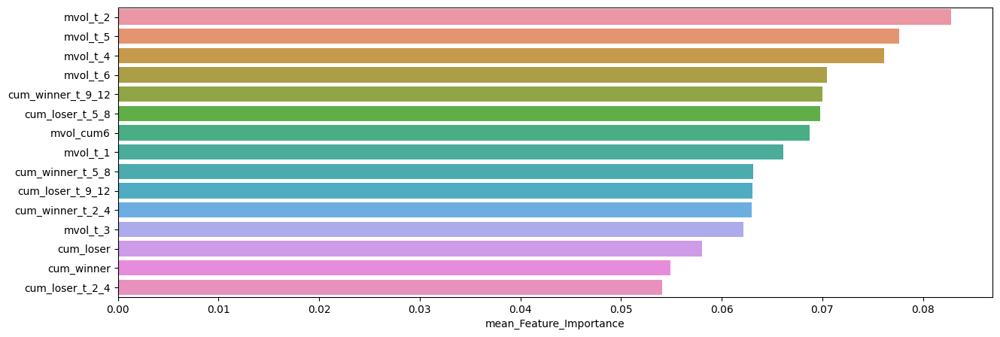

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.082780,0.106050,0.058492
mvol_t_5,0.077603,0.092717,0.063155
mvol_t_4,0.076132,0.094983,0.059453
mvol_t_6,0.070472,0.092359,0.048699
cum_winner_t_9_12,0.069989,0.093506,0.047734
cum_loser_t_5_8,0.069761,0.093653,0.048076
mvol_cum6,0.068775,0.104919,0.042196
mvol_t_1,0.066105,0.090630,0.049684
cum_winner_t_5_8,0.063125,0.077098,0.049174
cum_loser_t_9_12,0.063036,0.079628,0.046685



**************************************************

DATE : 19850430 ~ 20040130

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.27      0.33        70
         1.0       0.72      0.83      0.77       156

    accuracy                           0.66       226
   macro avg       0.57      0.55      0.55       226
weighted avg       0.63      0.66      0.63       226


accuracy : 0.6592920353982301

precision : 0.7182320441988951

recall : 0.8333333333333334

F1-Score : 0.771513353115727



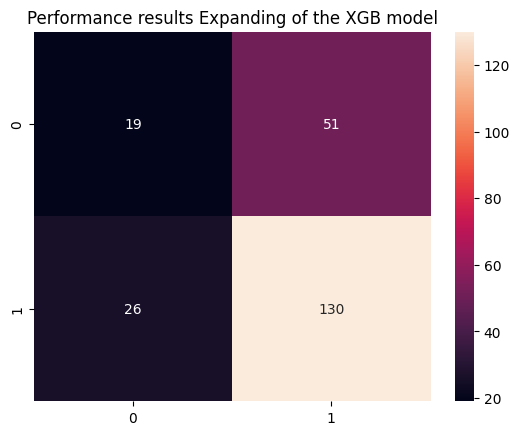


Feature Importance of the model



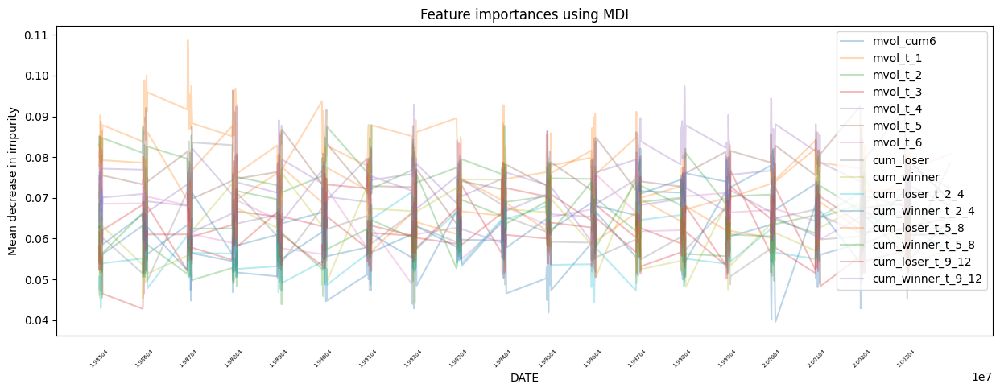

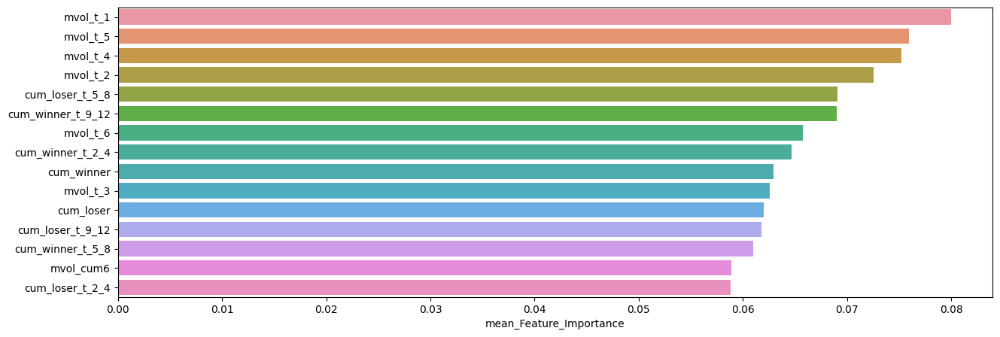

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.079958,0.108714,0.062848
mvol_t_5,0.075951,0.096413,0.059603
mvol_t_4,0.075202,0.097633,0.061616
mvol_t_2,0.072532,0.087868,0.058406
cum_loser_t_5_8,0.069066,0.090282,0.051090
cum_winner_t_9_12,0.068987,0.092376,0.052199
mvol_t_6,0.065717,0.083356,0.048912
cum_winner_t_2_4,0.064697,0.081607,0.046737
cum_winner,0.062929,0.081493,0.043959
mvol_t_3,0.062559,0.077434,0.042773



**************************************************

DATE : 20040227 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.45      0.27      0.34        96
         1.0       0.59      0.76      0.66       131

    accuracy                           0.55       227
   macro avg       0.52      0.51      0.50       227
weighted avg       0.53      0.55      0.52       227


accuracy : 0.5506607929515418

precision : 0.5857988165680473

recall : 0.7557251908396947

F1-Score : 0.66



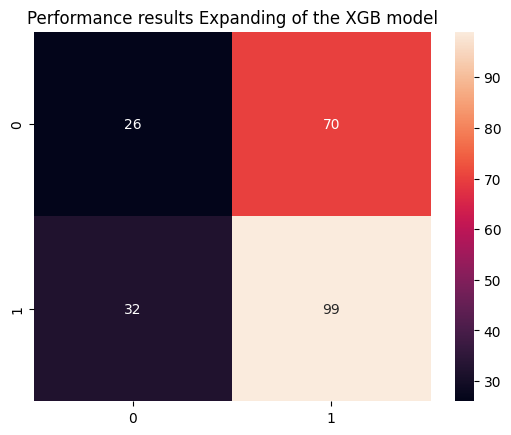


Feature Importance of the model



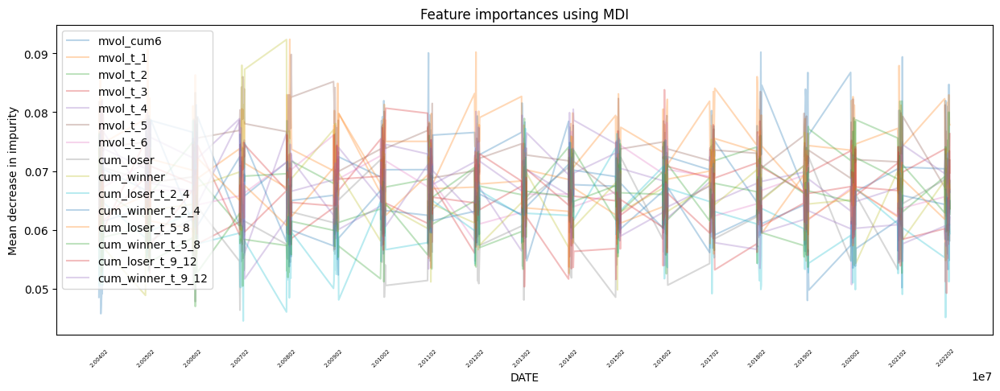

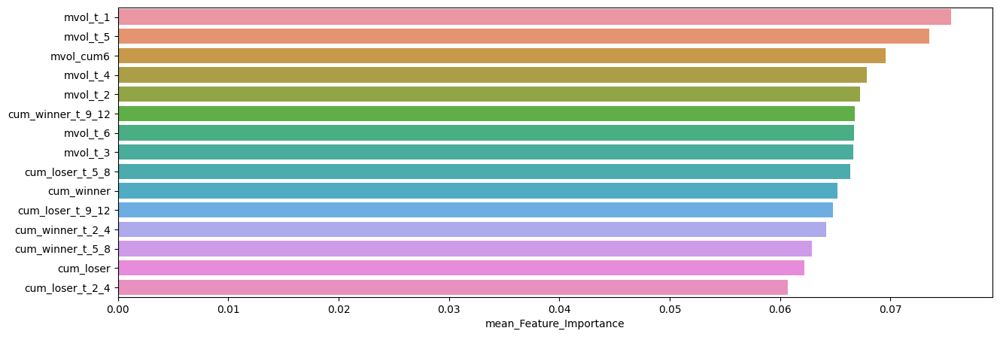

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.075470,0.092388,0.062212
mvol_t_5,0.073528,0.089819,0.061151
mvol_cum6,0.069542,0.090203,0.045740
mvol_t_4,0.067822,0.080511,0.050700
mvol_t_2,0.067240,0.081894,0.053341
cum_winner_t_9_12,0.066774,0.081852,0.051658
mvol_t_6,0.066701,0.078216,0.056326
mvol_t_3,0.066633,0.083816,0.052642
cum_loser_t_5_8,0.066330,0.079770,0.053686
cum_winner,0.065166,0.092355,0.048861


In [39]:
TML.slice_feature_importance(Expanding_XGB_Result, 4, 'Expanding', 'XGB')

Sharpe Ratio : 0.69144

최근 누적 수익률

  2022년-12월 -> 66354.05
  2022년-11월 -> 59783.74
  2022년-10월 -> 59783.74
  2022년-09월 -> 52937.62
  2022년-08월 -> 48128.09

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 66354.05
  2등 : 2022년-10월 -> 59783.74
  3등 : 2022년-11월 -> 59783.74
  4등 : 2008년-11월 -> 54047.80
  5등 : 2002년-09월 -> 53148.86
  6등 : 2022년-09월 -> 52937.62
  7등 : 2008년-12월 -> 52768.52
  8등 : 2009년-01월 -> 52768.52
  9등 : 2009년-02월 -> 52768.52
  10등 : 2009년-03월 -> 52768.52



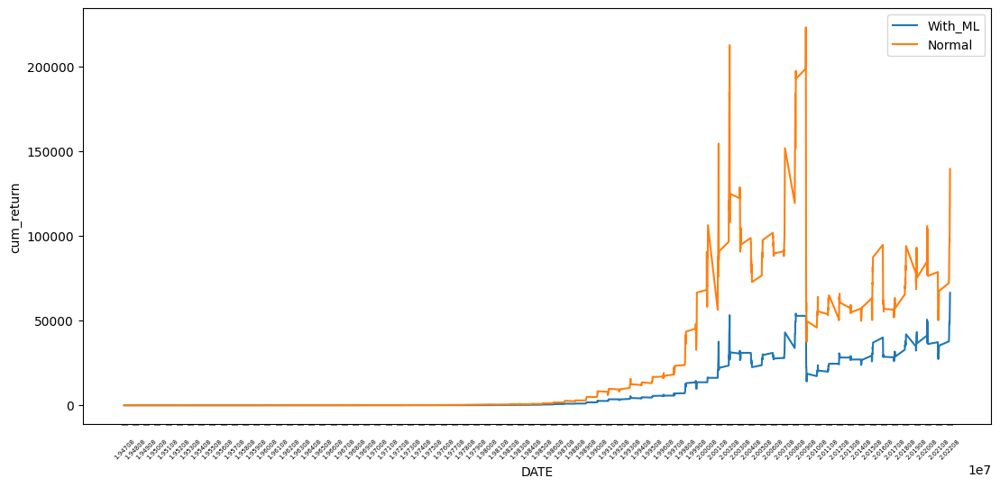

In [40]:
XGB_E_CUM_RETURN_static = TML.cumm_return_by_dynamic(Expanding_XGB_Result, WML, 'XGB_PRED_POS_WML', plot=True)

Sharpe Ratio : 0.70757

최근 누적 수익률

  2022년-12월 -> 27376.62
  2022년-11월 -> 25310.89
  2022년-10월 -> 24804.36
  2022년-09월 -> 22028.88
  2022년-08월 -> 20775.67

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2008년-11월 -> 35943.04
  2등 : 2009년-02월 -> 35705.87
  3등 : 2009년-01월 -> 35603.02
  4등 : 2008년-12월 -> 35373.18
  5등 : 2002년-09월 -> 34708.33
  6등 : 2008년-10월 -> 33094.26
  7등 : 2008년-09월 -> 32655.17
  8등 : 2002년-07월 -> 32026.55
  9등 : 2008년-06월 -> 31879.96
  10등 : 2009년-03월 -> 31838.69



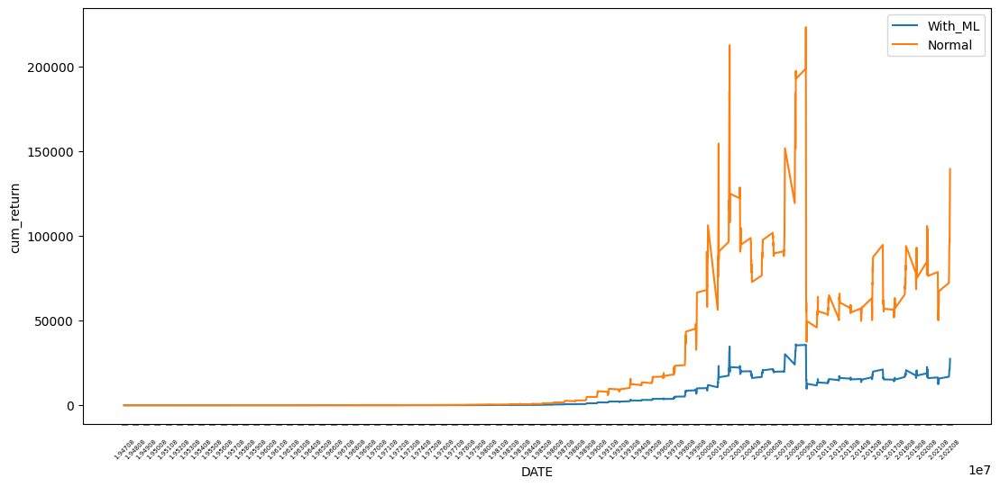

In [41]:
XGB_E_CUM_RETURN_dynamic = TML.cumm_return_by_dynamic(Expanding_XGB_Result, WML, 'XGB_PROB_POS_WML', plot=True)

# Performance

## F1 - Score

RDF의 F1-Score : 0.7324159021406728
GBC의 F1-Score : 0.7181528662420383
XGB의 F1-Score : 0.7250996015936256



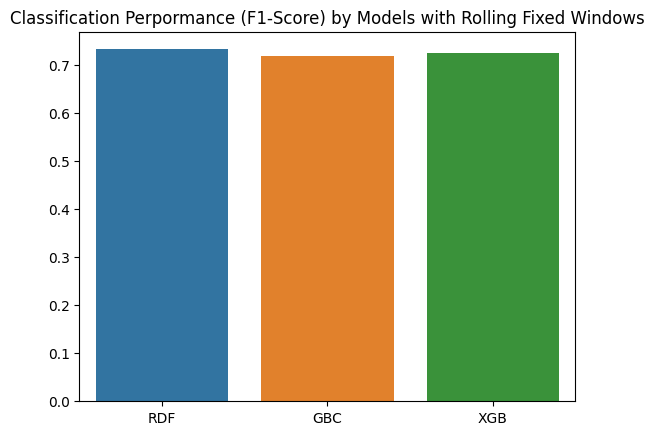

In [50]:
list_model = ['RDF', 'GBC', 'XGB']
list_result = [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Fixed Windows')
plt.show()

RDF의 F1-Score : 0.7518355359765051
GBC의 F1-Score : 0.7401812688821753
XGB의 F1-Score : 0.7199367088607594



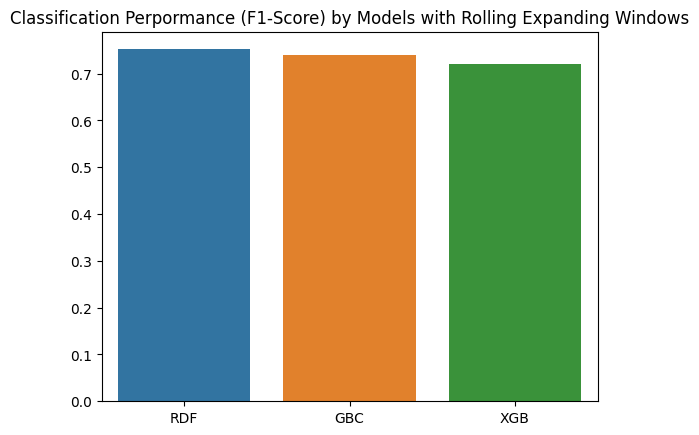

In [51]:
list_model = ['RDF', 'GBC', 'XGB']
list_result = [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

## Cum Return & Sharpe Ratio

In [58]:
CUM_WML = WML.copy()
CUM_WML['wml'] = (1 + CUM_WML.wml).cumprod() - 1
CUM_WML.columns = ['cum_return'] 

In [60]:
w_S = CUM_WML['cum_return'].mean()/CUM_WML['cum_return'].std()

In [65]:
last_r = CUM_WML['cum_return'].values[-1]

### Fixed

#### Static

ORG Sharpe Ratio : 0.570  최종 누적 수익률 : 118980.56181457831
RDF Sharpe Ratio : 0.674  최종 누적 수익률 : 8584.024438306307
GBC Sharpe Ratio : 0.722  최종 누적 수익률 : 10084.792348556959
XGB Sharpe Ratio : 0.624  최종 누적 수익률 : 35422.04944182088



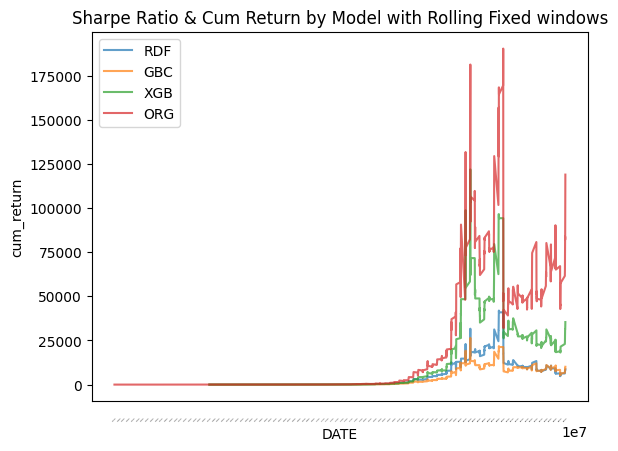

In [81]:
list_model = ['RDF', 'GBC', 'XGB']
list_cum_return =[RDF_F_CUM_RETURN_static,
                  GBC_F_CUM_RETURN_static,
                  XGB_F_CUM_RETURN_static]

print('{} Sharpe Ratio : {:0.3f}  최종 누적 수익률 : {}'.format('ORG', w_S, last_r))
for model, data in zip(list_model, list_cum_return):
  S = data['cum_return'].mean()/data['cum_return'].std()
  C = data['cum_return'].values[-1]
  print('{} Sharpe Ratio : {:0.3f}  최종 누적 수익률 : {}'.format(model, S, C))
  sns.lineplot(data=data, x=data.index, y='cum_return', alpha=0.7, label=model)

sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')

plt.title('Sharpe Ratio & Cum Return by Model with Rolling Fixed windows')
plt.xticks([WML.index[i] for i in range(0,len(WML.index), 12)])
plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=1,
                  width=0.1)

print()
plt.show()

#### Dynamic

ORG Sharpe Ratio : 0.570  최종 누적 수익률 : 118980.56181457831
RDF Sharpe Ratio : 0.773  최종 누적 수익률 : 4262.730497956493
GBC Sharpe Ratio : 0.734  최종 누적 수익률 : 6501.991347017028
XGB Sharpe Ratio : 0.704  최종 누적 수익률 : 20845.56535435224



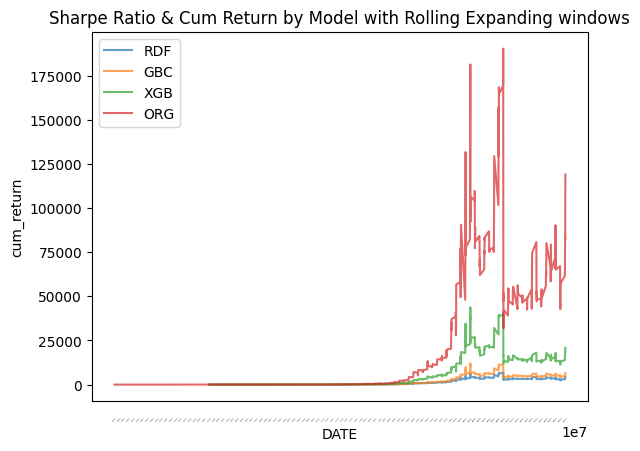

In [82]:
list_model = ['RDF', 'GBC', 'XGB']
list_cum_return =[RDF_F_CUM_RETURN_dynamic,
                  GBC_F_CUM_RETURN_dynamic,
                  XGB_F_CUM_RETURN_dynamic]

print('{} Sharpe Ratio : {:0.3f}  최종 누적 수익률 : {}'.format('ORG', w_S, last_r))
for model, data in zip(list_model, list_cum_return):
  S = data['cum_return'].mean()/data['cum_return'].std()
  C = data['cum_return'].values[-1]
  print('{} Sharpe Ratio : {:0.3f}  최종 누적 수익률 : {}'.format(model, S, C))
  sns.lineplot(data=data, x=data.index, y='cum_return', alpha=0.7, label=model)

sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')

plt.title('Sharpe Ratio & Cum Return by Model with Rolling Expanding windows')
plt.xticks([WML.index[i] for i in range(0,len(WML.index), 12)])
plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=1,
                  width=0.1)

print()
plt.show()

### Expanding

#### Static

ORG Sharpe Ratio : 0.570  최종 누적 수익률 : 118980.56181457831
RDF Sharpe Ratio : 0.712  최종 누적 수익률 : 65007.3784399725
GBC Sharpe Ratio : 0.562  최종 누적 수익률 : 426301.61885225464
XGB Sharpe Ratio : 0.691  최종 누적 수익률 : 66354.04786932784



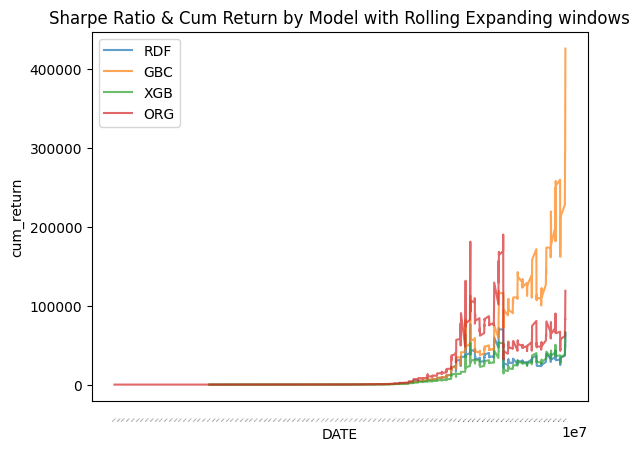

In [78]:
list_model = ['RDF', 'GBC', 'XGB']
list_cum_return =[RDF_E_CUM_RETURN_static,
                  GBC_E_CUM_RETURN_static,
                  XGB_E_CUM_RETURN_static]

print('{} Sharpe Ratio : {:0.3f}  최종 누적 수익률 : {}'.format('ORG', w_S, last_r))
for model, data in zip(list_model, list_cum_return):
  S = data['cum_return'].mean()/data['cum_return'].std()
  C = data['cum_return'].values[-1]
  print('{} Sharpe Ratio : {:0.3f}  최종 누적 수익률 : {}'.format(model, S, C))
  sns.lineplot(data=data, x=data.index, y='cum_return', alpha=0.7, label=model)

sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')

plt.title('Sharpe Ratio & Cum Return by Model with Rolling Expanding windows')
plt.xticks([WML.index[i] for i in range(0,len(WML.index), 12)])
plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=1,
                  width=0.1)

print()
plt.show()

#### Dynamic

ORG Sharpe Ratio : 0.570  최종 누적 수익률 : 118980.56181457831
RDF Sharpe Ratio : 0.728  최종 누적 수익률 : 8521.013187415187
GBC Sharpe Ratio : 0.704  최종 누적 수익률 : 20365.686375811103
XGB Sharpe Ratio : 0.708  최종 누적 수익률 : 27376.62237181778



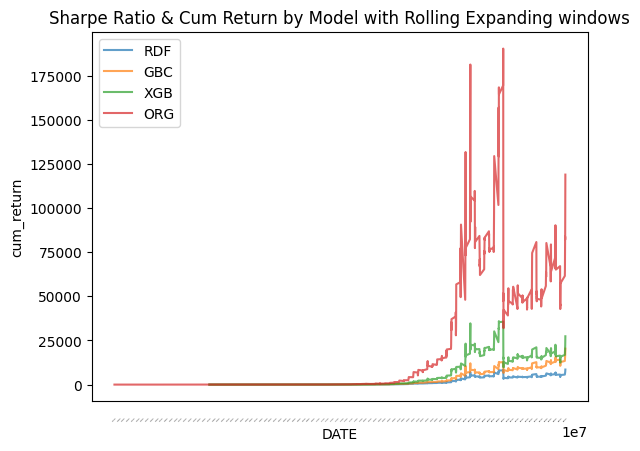

In [83]:
list_model = ['RDF', 'GBC', 'XGB']
list_cum_return =[RDF_E_CUM_RETURN_dynamic,
                  GBC_E_CUM_RETURN_dynamic,
                  XGB_E_CUM_RETURN_dynamic]

print('{} Sharpe Ratio : {:0.3f}  최종 누적 수익률 : {}'.format('ORG', w_S, last_r))
for model, data in zip(list_model, list_cum_return):
  S = data['cum_return'].mean()/data['cum_return'].std()
  C = data['cum_return'].values[-1]
  print('{} Sharpe Ratio : {:0.3f}  최종 누적 수익률 : {}'.format(model, S, C))
  sns.lineplot(data=data, x=data.index, y='cum_return', alpha=0.7, label=model)

sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')

plt.title('Sharpe Ratio & Cum Return by Model with Rolling Expanding windows')
plt.xticks([WML.index[i] for i in range(0,len(WML.index), 12)])
plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=1,
                  width=0.1)

print()
plt.show()